In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import kendalltau, spearmanr, pearsonr
import search_results_lib as srl
import json

In [2]:
HIGHLIGHT_COLORS = {
    "cuestionario-cpi": "#0072B2",          # azul
    "cpi-robertuito": "#D55E00",         # naranja
    "cpi-geo": "#CC79A7", # magenta
}
tops = [10, 20, 50, 100]

ignore=['index-index', 'ordenBusquedas', 'cuestionario_ordinal', 'cuestionario_no_common']
ignore_no_common = ['index-index', 'ordenBusquedas', 'cuestionario', 'cuestionario_ordinal']

thres = {
    'cuestionario': 0.6,
    'robertuito': 0,
    'tfidf': 0.6
}

thres_no_common = {
    'cuestionario_no_common': 0.6,
    'robertuito': 0,
    'tfidf': 0.6
}

segmentation=10

In [3]:
countries = [
    "Argentina",
    "Bolivia",
    "Chile",
    "Colombia",
    "Costa Rica",
    "Cuba",
    "Ecuador",
    "El Salvador",
    "Guatemala",
    "Honduras",
    "Mexico",
    "Nicaragua",
    "Panama",
    "Paraguay",
    "Peru",
    #"Puerto Rico",
    "Dominican Republic",
    "Uruguay",
    "Venezuela",
    "Spain"
]
n_countries = len(countries)
print(n_countries)  # 20
countries.sort()
df_dict = {}
corr_dict = {}

19


In [4]:
for i, country in enumerate(countries):
    print(f"{i+1}. {country}")

1. Argentina
2. Bolivia
3. Chile
4. Colombia
5. Costa Rica
6. Cuba
7. Dominican Republic
8. Ecuador
9. El Salvador
10. Guatemala
11. Honduras
12. Mexico
13. Nicaragua
14. Panama
15. Paraguay
16. Peru
17. Spain
18. Uruguay
19. Venezuela


## Caracteristicas con buena informacion mutua

In [5]:
def clean_features(features):
    import re
    return [
        re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", f)
        for f in features
    ]

fold_scores = pd.read_csv("../mi_results/crossval_data/clf_feature_scores_by_fold.csv")
feats_performance = fold_scores.groupby(['target', 'dataset', 'model', 'feature'])[['score', 'selected']].mean().reset_index().sort_values(['target', 'dataset', 'model', 'score'], ascending=[True, True, True, False])

#tfidf_feats = list(feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['score'] >= 0.8]['feature'].unique())
#forms_feats = list(feats_performance[feats_performance['dataset'] == 'forms'][feats_performance['score'] >= 0.8]['feature'].unique())

tfidf_feats = list(feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['selected'] >= 0.4]['feature'].unique())
forms_feats = list(feats_performance[feats_performance['dataset'] == 'forms'][feats_performance['selected'] >= 0.8]['feature'].unique())

tfidf_clean_feats = list(set(clean_features(tfidf_feats)))
forms_clean_feats = list(set(clean_features(forms_feats)))

take_from_expanded_dict = {
    'cuestionario': forms_feats,
    'robertuito': None,
    'tfidf': tfidf_feats
}

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [ ]:
len(tfidf_feats)

5038

In [100]:
tfidf_clean_feats = ["interesados", "figuran", "desarrollo social", "presentarse", "dades", "corrupción resultado", "circulación", "lacra", "rss", "inexistentes", "excepcional", "sobresueldos"]
forms_clean_feats = [
    "emociones__b",      # Tristeza
    "emociones__c",      # Ira
    "emociones__e",      # Sorpresa
    "intencion__c",      # Tomar acciones frente al problema (tomar acciones)
    "consecuencias__a",  # Penas o sanciones legales
    "consecuencias__c",  # Impunidad (falta de sanciones)
    "consecuencias__b",  # Consecuencias no legales (castigo social, pérdida de estatus)
    "involucrados__b",   # Gobierno nacional
    "involucrados__g",   # Tomadores de decisión no gubernamentales (líderes empresariales, activistas, etc.)
    "involucrados__h",   # Organizaciones internacionales o gobiernos extranjeros
    "tipo_entidad__c",   # Organismo internacional (ej. ONU)
    "localidad_problema__c",  # Regional (ej. América Latina)
]

In [24]:
top = 20

suffix = '_correlation_filtered'
#suffix = ''

feats_mi = pd.read_csv("../mi_results/mutual_information_top_per_dataset" + suffix + ".csv", sep=',', header=0)
#feats_mi = pd.read_csv("../mi_results/mi_whole_dataset.csv", sep='\t', header=0)
ordered_feats_mi = feats_mi.groupby(['dataset', 'clean_feature']).mean()
ordered_feats_mi.sort_values('mutual_information', ascending=False, inplace=True)

tfidf_best_feats = ordered_feats_mi.loc['bow'].head(top).index.tolist()
forms_best_feats = ordered_feats_mi.loc['forms'].head(top).index.tolist()
robertuito_best_feats = ordered_feats_mi.loc['robertuito'].head(top).index.tolist()
'''
feats_mi = pd.read_csv("../mi_results/mutual_information_top_per_segment" + suffix + ".csv")
ordered_feats_mi = feats_mi.groupby(['dataset', 'clean_feature', 'segment']).mean()
ordered_feats_mi.sort_values(['segment', 'mutual_information'], ascending=[True, False], inplace=True)
ordered_feats_mi.reset_index(inplace=True)

ordered_feats_mi[ordered_feats_mi['dataset'] == 'tfidf'].groupby('segment').head(top)

tfidf_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'tfidf']['clean_feature'].unique().tolist()
tfidf_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'tfidf') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}
forms_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'forms']['clean_feature'].unique().tolist()
forms_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'forms') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}
robertuito_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'robertuito']['clean_feature'].unique().tolist()
robertuito_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'robertuito') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}

seg_feat_dict = {
    'tfidf': tfidf_seg_feat_dict,
    'cuestionario': forms_seg_feat_dict,
    'robertuito': robertuito_seg_feat_dict
}
'''

'\nfeats_mi = pd.read_csv("../mi_results/mutual_information_top_per_segment" + suffix + ".csv")\nordered_feats_mi = feats_mi.groupby([\'dataset\', \'clean_feature\', \'segment\']).mean()\nordered_feats_mi.sort_values([\'segment\', \'mutual_information\'], ascending=[True, False], inplace=True)\nordered_feats_mi.reset_index(inplace=True)\n\nordered_feats_mi[ordered_feats_mi[\'dataset\'] == \'tfidf\'].groupby(\'segment\').head(top)\n\ntfidf_best_feats = ordered_feats_mi[ordered_feats_mi[\'dataset\'] == \'tfidf\'][\'clean_feature\'].unique().tolist()\ntfidf_seg_feat_dict = {\n    segment: ordered_feats_mi[(ordered_feats_mi[\'dataset\'] == \'tfidf\') & (ordered_feats_mi[\'segment\'] == segment)].head(top)[\'clean_feature\'].tolist()\n    for segment in ordered_feats_mi[\'segment\'].unique()\n}\nforms_best_feats = ordered_feats_mi[ordered_feats_mi[\'dataset\'] == \'forms\'][\'clean_feature\'].unique().tolist()\nforms_seg_feat_dict = {\n    segment: ordered_feats_mi[(ordered_feats_mi[\'datas

# Datos
## Indices de corrupcion

In [4]:
path = "../datos/CPI2024-Results-and-trends.csv"
df_index = pd.read_csv(path, header=2, encoding="ISO-8859-1", sep='\t')
df_index = df_index[df_index["Country / Territory"].isin(countries)]
df_index.dropna(how="all", axis=1, inplace=True)
df_index.rename(columns={"Country / Territory": "country"}, inplace=True)
df_index.set_index('country', inplace=True)

cpi2024_sources = {
    "rank": "Rank",
    "cpi": "CPI 2024 score",
    #"gi": "S&P / Global Insights Country Risk Ratings",
    #"prs": "PRS International Country Risk Guide",
    #"vdem": "Varieties of Democracy Project",
    #"wef": "World Economic Forum EOS",
    #"wjp": "World Justice Project Rule of Law cpi",
    #"bti": "Bertelsmann Foundation Transformation cpi",
    #"eiu": "Economist Intelligence Unit Country Ratings"
}
df_index.rename(columns=dict(zip(cpi2024_sources.values(), cpi2024_sources.keys())), inplace=True)

df_index.drop(columns=[i for i in df_index.columns if i not in cpi2024_sources.keys()], inplace=True)
df_index = df_index.reindex(countries)
df_index.dropna(how='all', inplace=True)
df_index.sort_index(inplace=True)
df_dict["cpi"] = df_index
df_index

,cpi,rank
country,,
Argentina,37,99
Bolivia,28,133
Chile,63,32
Colombia,39,92
Costa Rica,58,42
Cuba,41,82
Dominican Republic,36,104
Ecuador,32,121
El Salvador,30,130


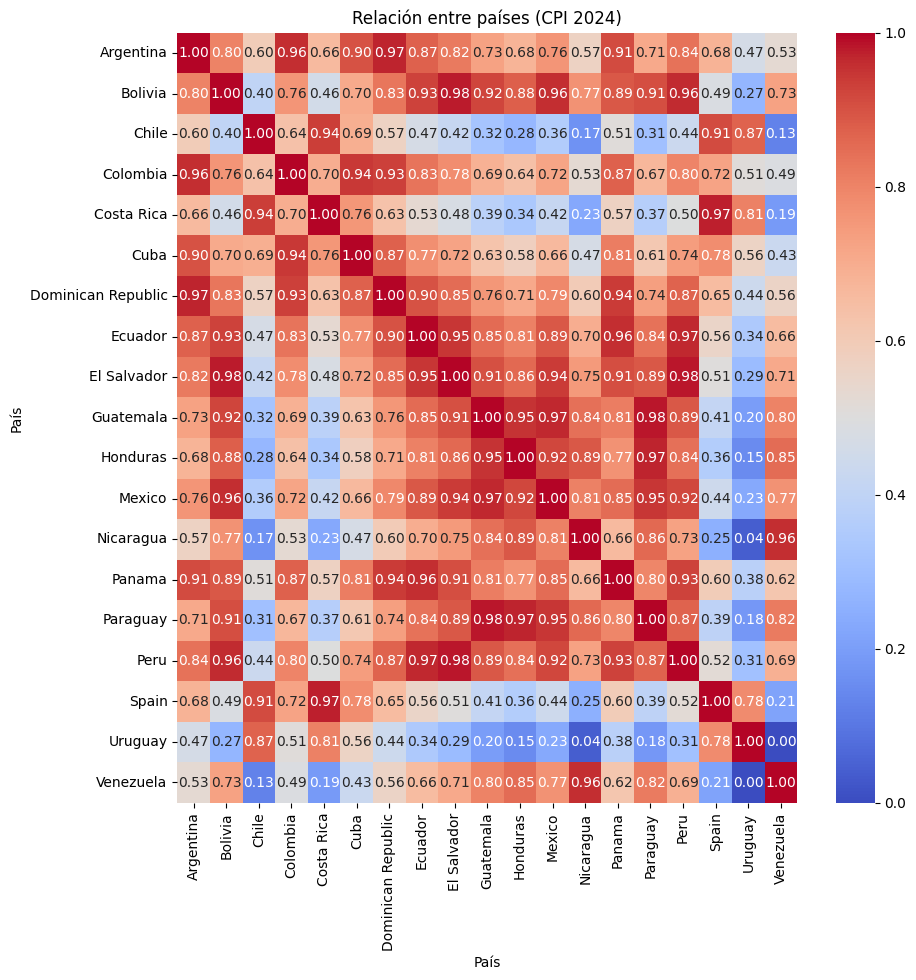

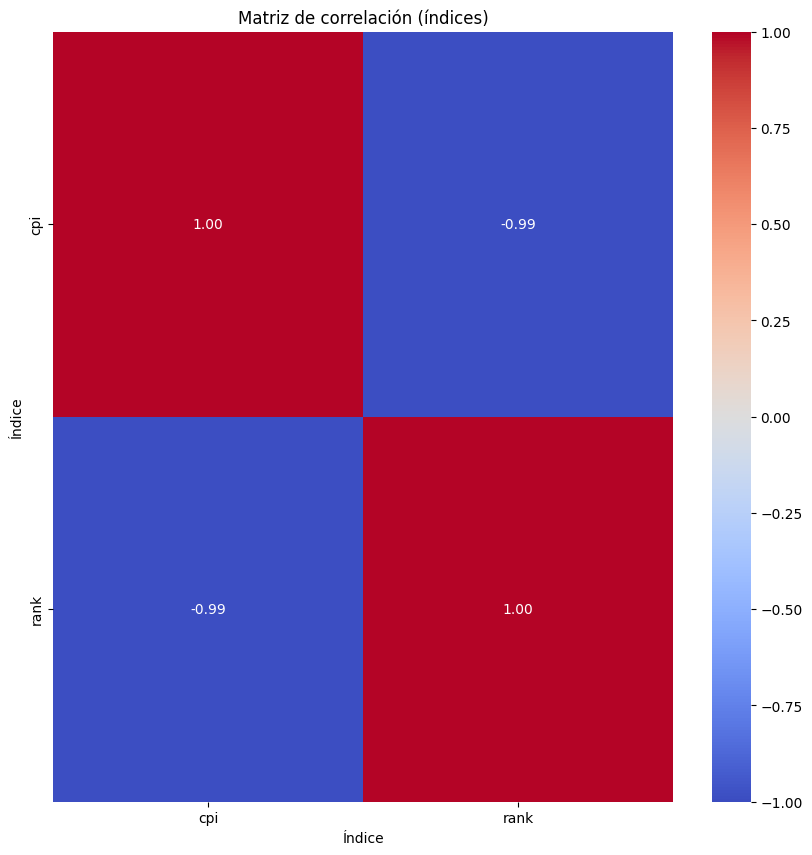

In [5]:
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform

X = df_index.copy()

# Asegura numérico y limpia inf
X = X.apply(pd.to_numeric, errors="coerce").replace([np.inf, -np.inf], np.nan)

# Imputa NaNs con mediana de cada columna
X_imp = X.fillna(X.median(numeric_only=True))

cpi = squareform(pdist(X_imp.values, metric="euclidean"))
cpi = 1 - (cpi / np.max(cpi))  # Normaliza a [0, 1] y convierte a similitud
corr_dict["cpi"] = pd.DataFrame(cpi, index=X_imp.index, columns=X_imp.index)

plt.figure(figsize=(10,10))
sns.heatmap(corr_dict['cpi'], annot=True, cmap="coolwarm", vmin=0, vmax=1, fmt=".2f")
#sns.heatmap(np.abs(index_corr), annot=True, cmap="coolwarm", vmin=0, vmax=1, fmt=".1f")
plt.title("Relación entre países (CPI 2024)")
plt.xlabel("País")
plt.ylabel("País")
plt.show()

corr_dict['index-index'] = df_index.corr()

plt.figure(figsize=(10,10))
#sns.heatmap(index_corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
sns.heatmap(corr_dict['index-index'], annot=True, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f")
plt.title("Matriz de correlación (índices)")
plt.xlabel("Índice")
plt.ylabel("Índice")
plt.show()

## Rankings resultados de busqueda

In [6]:
Nombre_Archivo = f"../datos/resultados_corrupcion.json"

with open(Nombre_Archivo, "r") as file:
    resultados = json.load(file)
for i in range(len(resultados)):
    if resultados[i]['country'] == 'Puerto Rico':
        resultados.pop(i)
        break
resultados.sort(key=lambda x: x['country'])

# Leer el archivo JSON guardado
Nombre_Archivo = f"../datos/res_unicos_corrupcion.json"

with open(Nombre_Archivo, "r") as file:
    all_hrefs = json.load(file)

max_len = max([len(r['search_results']['results']) for r in resultados])
rankings = {}
for r in resultados:
    pages = [all_hrefs.index(res['href']) for res in r['search_results']['results']]
    if len(pages) < max_len:
        diff = max_len - len(pages)
        pages += [np.nan] * diff
    rankings[r['country']] = pages
df_rankings = pd.DataFrame(rankings).T
df_rankings.sort_index(inplace=True)
df_dict["rankings"] = df_rankings
df_rankings

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Argentina,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0
Bolivia,0.0,1.0,3.0,5.0,2.0,4.0,28.0,100.0,55.0,101.0,...,153.0,154.0,155.0,97.0,156.0,157.0,65.0,158.0,59.0,NaN
Chile,1.0,4.0,159.0,160.0,3.0,2.0,5.0,33.0,161.0,144.0,...,51.0,208.0,116.0,209.0,125.0,210.0,211.0,212.0,139.0,82.0
Colombia,0.0,1.0,3.0,2.0,4.0,5.0,28.0,8.0,119.0,43.0,...,266.0,75.0,144.0,132.0,124.0,146.0,267.0,131.0,86.0,268.0
Costa Rica,1.0,3.0,2.0,4.0,5.0,158.0,28.0,269.0,270.0,271.0,...,137.0,59.0,82.0,125.0,155.0,298.0,299.0,300.0,NaN,NaN
Cuba,0.0,1.0,2.0,3.0,4.0,5.0,28.0,55.0,43.0,8.0,...,315.0,30.0,299.0,141.0,153.0,316.0,32.0,101.0,NaN,NaN
Dominican Republic,0.0,1.0,3.0,2.0,4.0,5.0,106.0,120.0,28.0,527.0,...,300.0,475.0,79.0,361.0,127.0,344.0,143.0,155.0,31.0,312.0
Ecuador,1.0,3.0,159.0,5.0,317.0,2.0,4.0,63.0,318.0,319.0,...,68.0,136.0,353.0,96.0,138.0,58.0,153.0,NaN,NaN,NaN
El Salvador,0.0,1.0,2.0,3.0,4.0,5.0,28.0,354.0,55.0,43.0,...,143.0,158.0,138.0,140.0,209.0,53.0,314.0,77.0,362.0,203.0
Guatemala,0.0,1.0,2.0,3.0,5.0,4.0,49.0,116.0,28.0,294.0,...,285.0,382.0,312.0,146.0,51.0,131.0,383.0,166.0,360.0,384.0


## Matriz de distancia entre capitales

In [7]:
capital_coords = {
    "Argentina": (-34.6037, -58.3816),            # Buenos Aires
    "Bolivia": (-16.4897, -68.1193),              # La Paz (sede de gobierno)
    "Chile": (-33.4489, -70.6693),                 # Santiago
    "Colombia": (4.7110, -74.0721),                # Bogotá
    "Costa Rica": (9.9281, -84.0907),              # San José
    "Cuba": (23.1136, -82.3666),                   # La Habana
    "Ecuador": (-0.1807, -78.4678),                # Quito
    "El Salvador": (13.6929, -89.2182),            # San Salvador
    "Guatemala": (14.6349, -90.5061),              # Ciudad de Guatemala
    "Honduras": (14.0723, -87.1921),               # Tegucigalpa
    "Mexico": (19.4326, -99.1332),                 # Ciudad de México
    "Nicaragua": (12.1140, -86.2362),              # Managua
    "Panama": (8.9824, -79.5199),                  # Ciudad de Panamá
    "Paraguay": (-25.2637, -57.5759),              # Asunción
    "Peru": (-12.0464, -77.0428),                  # Lima
    #"Puerto Rico": (18.4655, -66.1057),            # San Juan
    "Dominican Republic": (18.4861, -69.9312),     # Santo Domingo
    "Uruguay": (-34.9011, -56.1645),               # Montevideo
    "Venezuela": (10.4806, -66.9036),              # Caracas
    "Spain": (40.4168, -3.7038)                    # Madrid
}

D = np.zeros((n_countries, n_countries), dtype=float)

for i, ci in enumerate(countries):
    for j, cj in enumerate(countries):
        if i == j:
            D[i, j] = 0.0
        else:
            D[i, j] = srl.haversine_km(capital_coords[ci], capital_coords[cj])

# DataFrame cuadrado país x país (normalizado 0..1)
corr_dict['geo'] = pd.DataFrame(D/D.max(), index=countries, columns=countries)
corr_dict['geo']

,Argentina,Bolivia,Chile,Colombia,Costa Rica,Cuba,Dominican Republic,Ecuador,El Salvador,Guatemala,Honduras,Mexico,Nicaragua,Panama,Paraguay,Peru,Spain,Uruguay,Venezuela
Argentina,0.000000,0.208884,0.106421,0.436413,0.527375,0.644683,0.563288,0.407404,0.586834,0.601879,0.580192,0.690724,0.557697,0.498319,0.097313,0.293159,0.938599,0.019177,0.475894
Bolivia,0.208884,0.000000,0.177817,0.228609,0.319833,0.436198,0.363872,0.199874,0.381119,0.396643,0.373023,0.489514,0.350660,0.289447,0.136945,0.100993,0.856755,0.221200,0.280501
Chile,0.106421,0.177817,0.000000,0.397893,0.469823,0.598986,0.539656,0.353945,0.523156,0.536891,0.520194,0.617647,0.497864,0.449454,0.145706,0.230461,1.000000,0.125480,0.457947
Colombia,0.436413,0.228609,0.397893,0.000000,0.116575,0.208529,0.149168,0.068297,0.181062,0.197184,0.165838,0.296273,0.146708,0.071599,0.353145,0.176794,0.748609,0.447272,0.095074
Costa Rica,0.527375,0.319833,0.469823,0.116575,0.000000,0.138064,0.167913,0.120046,0.065178,0.081429,0.053357,0.180385,0.031536,0.047864,0.453559,0.239630,0.792649,0.540678,0.175822
Cuba,0.644683,0.436198,0.598986,0.208529,0.138064,0.000000,0.129930,0.245213,0.118866,0.118942,0.105244,0.166666,0.120515,0.149533,0.561219,0.369306,0.695206,0.655775,0.201867
Dominican Republic,0.563288,0.363872,0.539656,0.149168,0.167913,0.129930,0.000000,0.212627,0.198743,0.208640,0.178053,0.286779,0.176177,0.138166,0.471416,0.325498,0.625708,0.571101,0.088568
Ecuador,0.407404,0.199874,0.353945,0.068297,0.120046,0.245213,0.212627,0.000000,0.181711,0.197489,0.173156,0.293000,0.150787,0.095825,0.334509,0.124158,0.816429,0.420632,0.162935
El Salvador,0.586834,0.381119,0.523156,0.181062,0.065178,0.118866,0.198743,0.181711,0.000000,0.016252,0.020813,0.115301,0.034367,0.110225,0.516219,0.295380,0.808345,0.600858,0.229057
Guatemala,0.601879,0.396643,0.536891,0.197184,0.081429,0.118942,0.208640,0.197489,0.016252,0.000000,0.033866,0.099113,0.050483,0.126174,0.531976,0.309924,0.812255,0.616056,0.243085


## Evaluaciones de cuestionario

In [8]:
df_responses = pd.read_csv("../datos/responses_llama.csv", sep='\t', header=0)

multi_choice = ['proposito',
                'informacion_presentada',
                'consecuencias',
                'intencion',
                'localidad_problema',
                'involucrados',
                'emociones']

possible_answers = {"tipo_entidad": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "origen_entidad": ['a', 'b'],
                    "vision": ['a', 'b', 'c', 'd'],
                    'que_muestra': ['a', 'b', 'c', 'd'],
                    'formalidad': ['a', 'b'],
                    'nivel_educacion': ['a', 'b'],
                    'tono': ['a', 'b'],
                    "proposito": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "informacion_presentada": ['a', 'b', 'c'],
                    "consecuencias": ['a', 'b', 'c', 'd'],
                    "intencion": ['a', 'b', 'c', 'd', 'e', 'f'],
                    "localidad_problema": ['a', 'b', 'c'],
                    "involucrados": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h'],
                    "emociones": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
                    }
single_questions = [q for q in possible_answers if q not in multi_choice]

# humano < 75% precision llama < 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'emociones__h', 'formalidad', 'localidad_problema__a']
bad_questions = ['proposito__d', 'tono', 'que_muestra', 'proposito__g', 'proposito__b', 'emociones__h', 'formalidad']
# humano < 75% precision llama <= 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'involucrados__f', 'origen_entidad', 'intencion__b', 'emociones__h', 'vision', 'intencion__a', 'formalidad', 'involucrados__b', 'tipo_entidad', 'localidad_problema__a', 'localidad_problema__b']
#bad_questions.remove('emociones__h') # se elimina emocion neutral
for q in bad_questions:
    if "__" not in q:
        for i in possible_answers.get(q, []):
            bad_questions.append(f"{q}__{i}")
bad_questions = [bad for bad in bad_questions if "__" in bad]

df_pag_info = srl.analyze_pages(df_responses, multi_choice, possible_answers)
df_pag_info = df_pag_info.drop(columns=bad_questions)
df_pag_info.index.name = 'page_id'
one_hot_cols = [col for col in df_pag_info.columns if df_pag_info[col].isin([0, 1]).all()]
df_pag_info_ordinal = srl.analyze_pages(df_responses, multi_choice, possible_answers, ordinal=True)
df_pag_info_ordinal = df_pag_info_ordinal.drop(columns=bad_questions)
#df_dict["cuestionario"] = df_pag_info[forms_best_feats]
df_dict["cuestionario"] = df_pag_info#[forms_clean_feats]
#df_dict["cuestionario_ordinal"] = df_pag_info_ordinal

df_dict['cuestionario']

,nivel_educacion__a,nivel_educacion__b,origen_entidad__a,origen_entidad__b,tipo_entidad__a,tipo_entidad__b,tipo_entidad__c,tipo_entidad__d,tipo_entidad__e,tipo_entidad__f,...,involucrados__f,involucrados__g,involucrados__h,emociones__a,emociones__b,emociones__c,emociones__d,emociones__e,emociones__f,emociones__g
page_id,,,,,,,,,,,,,,,,,,,,,
0,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
1,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.333333,0.000000,0.000000
2,0,1,0,1,0,0,0,0,0,0,...,0.666667,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.333333,0.000000
3,0,1,0,1,0,0,1,0,0,0,...,0.333333,0.000000,0.333333,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,0,1,0,1,0,0,0,0,0,0,...,1.000000,0.333333,0.000000,0.0,0.0,0.0,0.333333,0.333333,0.333333,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0,1,1,0,0,0,0,1,0,0,...,0.333333,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.333333,0.000000,0.333333
593,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.333333,0.333333
594,0,1,1,0,0,1,0,0,0,0,...,0.666667,0.000000,0.333333,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.666667


## Robertuito

In [9]:
bad_labels = ['emotion__others', 'sentiment__NEU', 'irony__not ironic']
df_robertuito = pd.read_csv("../datos/robertuito_all_results.csv").drop(columns=bad_labels)
df_robertuito.set_index('pagina', inplace=True)
df_robertuito.index.name = 'page_id'
df_dict["robertuito"] = df_robertuito#[robertuito_best_feats]
df_robertuito

,emotion__joy,emotion__sadness,emotion__anger,emotion__fear,emotion__surprise,emotion__disgust,sentiment__NEG,sentiment__POS,hate__speech__hateful,hate__speech__targeted,hate__speech__aggressive,irony__ironic
page_id,,,,,,,,,,,,
12,0.00,0.02,0.75,0.0,0.01,0.09,0.84,0.01,0.04,0.01,0.02,0.00
571,0.00,0.00,0.00,0.0,0.00,0.00,0.09,0.05,0.03,0.01,0.02,0.13
200,0.00,0.00,0.00,0.0,0.00,0.00,0.07,0.12,0.02,0.01,0.01,0.01
394,0.00,0.00,0.00,0.0,0.00,0.00,0.07,0.15,0.02,0.01,0.02,0.01
397,0.00,0.01,0.04,0.0,0.00,0.00,0.65,0.03,0.03,0.01,0.03,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.01,0.00,0.00,0.0,0.00,0.00,0.10,0.14,0.02,0.01,0.01,0.08
9,0.00,0.00,0.00,0.0,0.00,0.00,0.17,0.09,0.02,0.00,0.01,0.00
575,0.00,0.01,0.64,0.0,0.00,0.05,0.32,0.03,0.02,0.00,0.02,0.01


## TD-IDF

In [10]:
#df_dict['tfidf'] = pd.read_csv('../tfidf_pags_corrupcion.csv')
df_dict['tfidf'] = pd.read_csv('../datos/matriz_tfidf.csv', index_col=0)
df_dict['tfidf'].index.name = 'page_id'

#df_dict['tfidf'] = df_dict['tfidf'][[col for col in tfidf_best_feats if col in df_dict['tfidf'].columns]]
df_dict['tfidf'] = df_dict['tfidf']#[[col for col in tfidf_clean_feats if col in df_dict['tfidf'].columns]]
df_dict['tfidf']

,0,0 0,0 00,0 01,0 05,0 1,0 10,0 100,0 2,0 3,...,youtranscripts,youtranscripts com,youtube,z,zacatecas,zambia,zelanda,zelanda oman,zona,zonas
page_id,,,,,,,,,,,,,,,,,,,,,
0,0.013227,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.003564,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.037781,0.0,0.0,0.0,0.0,0.0,0.014403,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.029989,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
593,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
594,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.032588,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
df_dict['tfidf']['pgr'].iloc[200:250]

page_id
217    0.000000
218    0.000000
221    0.000000
222    0.000000
223    0.000000
224    0.000000
225    0.000000
227    0.000000
228    0.000000
229    0.000000
230    0.000000
231    0.000000
232    0.000000
233    0.000000
234    0.007838
236    0.000000
237    0.000000
238    0.000000
240    0.000000
241    0.000000
242    0.000000
243    0.000000
244    0.000000
245    0.000000
246    0.000000
250    0.000000
251    0.000000
252    0.000000
253    0.000000
254    0.000000
256    0.000000
257    0.000000
258    0.000000
259    0.000000
260    0.000000
261    0.000000
262    0.000000
263    0.000000
265    0.000000
267    0.000000
268    0.000000
269    0.000000
270    0.000000
271    0.058493
272    0.008411
273    0.000000
274    0.000000
275    0.002371
276    0.008411
277    0.000000
Name: pgr, dtype: float64

In [7]:
for i in range(len(df_dict['tfidf']['pgr'])):
    if df_dict['tfidf']['pgr'].iloc[i] > 0:
        print(i)

214
243
244
247
248
252
325
355
370
385
401
419


### Seleccion de caracteristicas por Word2Vec

In [ ]:
'''def get_w2v(token, model, default='none', acentos_map=None):
    # 1. Si hay mapa, traducir el token completo (para unigramas)
    if acentos_map is not None:
        token = acentos_map.get(token, token)  # Si no está, se queda igual
    
    # 2. Lógica original (primer if)
    if ' ' not in token:
        if token in model:
            return model[token]
    
    # 3. Lógica original (segundo if, redundante pero no lo toco)
    if token in model:
        return model[token]
    
    # 4. Si es bigrama (separado por espacio)
    parts = token.split(' ')
    
    # 5. Aplicar mapa a cada parte si existe
    if acentos_map is not None:
        parts = [acentos_map.get(p, p) for p in parts]
    
    vecs = []
    # 6. Si alguna parte no está en el modelo, devolver cero o None
    if (parts[0] not in model) or (parts[1] not in model):
        if default == 'zero':
            return np.zeros(model.vector_size)
        else:
            return None
    
    # 7. Promediar vectores de las partes
    for p in parts:
        if p in model:
            vecs.append(model[p])
    if len(vecs) > 0:
        return np.mean(vecs, axis=0)
    
from gensim.models import KeyedVectors

modelo = KeyedVectors.load_word2vec_format('../datos/word2vec/complete.vector')

import unicodedata

def quitar_acentos(texto):
    return unicodedata.normalize('NFKD', texto).encode('ASCII', 'ignore').decode('ASCII')

# Construir mapa: clave sin acentos → valor con acentos (elige el más frecuente si hay colisión)
acentos_map = {}
for token_original in modelo.key_to_index:
    token_plano = quitar_acentos(token_original)
    if token_plano not in acentos_map:
        acentos_map[token_plano] = token_original
    else:
        # Si ya existe, quedarse con el de mayor frecuencia
        freq_actual = modelo.get_vecattr(acentos_map[token_plano], 'count')
        freq_nuevo = modelo.get_vecattr(token_original, 'count')
        if freq_nuevo > freq_actual:
            acentos_map[token_plano] = token_original
'''

SyntaxError: incomplete input (2275463564.py, line 1)

In [ ]:
'''vecs = []
tokens = []
vec = get_w2v('corrupcion', modelo, acentos_map=acentos_map)
if vec is not None:
    vecs.append(vec)
    tokens.append('corrupcion')
for token in df_dict['tfidf'].columns:
    if (' ' not in token) and all(subs not in token for subs in ['corrupcion ', ' corrupcion']):
        vec = get_w2v(token, modelo, acentos_map=acentos_map)
        if vec is not None:
            vecs.append(vec)
            tokens.append(token)

kv = KeyedVectors(vector_size=modelo.vector_size)
kv.add_vectors(tokens, vecs)

#del modelo, vecs, tokens

sim_w2v = kv.most_similar('corrupcion', topn=400)
df_dict['w2v'] = df_dict['tfidf'][[tup[0] for tup in sim_w2v]].copy()
#del kv, sim_w2v
'''

In [12]:
feats_w2v = pd.read_csv('../datos/feats_w2v.txt', header=0, sep='\t')
feats = 'sin_corrupcion'
df_dict['w2v'] = df_dict['tfidf'][feats_w2v[feats]]
df_dict['w2v']

,delincuencia,inestabilidad politica,represion,criminalidad,burocracia,lucha fraude,ineficiencia,ilegalidad,ineficacia,violencia,...,democracia derecho,delitos comprendidos,incertidumbre,honradez,desigualdades,instituciones financieras,delito,delito bienes,gobierno federal,materia
page_id,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.023586
1,0.004044,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.011090,0.0,0.0,0.008531
2,0.009581,0.028119,0.038888,0.0,0.010267,0.014227,0.0118,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.006569,0.0,0.0,0.006737
3,0.290319,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.022116,0.0,0.0,0.000000
4,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.092929,0.0,0.0,0.023333,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000
593,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.070338,0.0,0.0,0.000000
594,0.000000,0.000000,0.000000,0.0,0.000000,0.054912,0.0000,0.00000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000


In [17]:
feats_w2v

,original,sin_corrupcion,2_gram,1_gram
0,corrupcion corrupcion,delincuencia,inestabilidad politica,delincuencia
1,corrupcion facilitadora,inestabilidad politica,lucha fraude,represion
2,corrupcion 2023,represion,obstruccion justicia,criminalidad
3,corrupcion sistemica,criminalidad,politica criminal,burocracia
4,corrupcion ipc,burocracia,abuso autoridad,ineficiencia
...,...,...,...,...
395,vida politica,instituciones financieras,internacional publica,corromper
396,pirateria,delito,publicos extranjeros,corporaciones
397,politica social,delito bienes,asistencia judicial,justificacion
398,social politica,gobierno federal,regionales integracion,vida


In [20]:
feats_w2v['sin_corrupcion'].tail(50)

350                  solidaridad
351                falsificacion
352              denuncias actos
353            delito tipificado
354                      equidad
355                        3 ley
356                    denuncian
357             confianza social
358              cargos publicos
359          organismos publicos
360      administracion recursos
361        presidencia republica
362                     blanqueo
363             tipificar delito
364               u organizacion
365         politicas privacidad
366                   neoliberal
367                     politico
368                contradiccion
369                 presente ley
370                   prevencion
371         cualquier naturaleza
372            seguridad publica
373                     fiscales
374                  institucion
375         civil organizaciones
376                unidad fiscal
377                     probidad
378             cumplimiento ley
379                   existencia
380       

In [5]:
count = 0
for token in df_dict['w2v'].columns:
    if 'corrupcion' not in token:
        count += 1
print(count)

67


# Estadisticos

In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['tfidf'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,capacitar_delta_cum_s8,0.881747,6.043963e-07,19,NaN,cpi,delta_cum,0.881747,capacitar
1,testigos_mean_s8,0.852679,3.530821e-06,19,NaN,cpi,mean,0.852679,testigos
2,fomentar_delta_cum_s8,0.850747,3.917182e-06,19,NaN,cpi,delta_cum,0.850747,fomentar
3,convención interamericana_mean_s8,0.849747,4.131168e-06,19,NaN,cpi,mean,0.849747,convención interamericana
4,testigos_std_s8,0.849466,4.192980e-06,19,NaN,cpi,std,0.849466,testigos
...,...,...,...,...,...,...,...,...,...
499995,únicos_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,únicos
499996,útil_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,útil
499997,útiles_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,útiles
499998,русский_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,русский


In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,emociones__b_delta_cum_s8,0.694737,0.000963,19,NaN,cpi,delta_cum,0.694737,emociones__b
1,emociones__b_mean_s8,0.671552,0.001641,19,NaN,cpi,mean,0.671552,emociones__b
2,emociones__b_std_s8,0.671552,0.001641,19,NaN,cpi,std,0.671552,emociones__b
3,intencion__c_cum_s9,0.663158,0.001968,19,NaN,cpi,cum,0.663158,intencion__c
4,intencion__c_cum_s10,0.663158,0.001968,19,NaN,cpi,cum,0.663158,intencion__c
...,...,...,...,...,...,...,...,...,...
2695,involucrados__h_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,involucrados__h
2696,emociones__a_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__a
2697,emociones__b_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__b
2698,emociones__c_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__c


In [18]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance#.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,tipo_entidad__c_mean_s9,0.693664,0.001409,18,NaN,cpi,mean,0.693664,tipo_entidad__c
1,tipo_entidad__c_std_s9,0.693664,0.001409,18,NaN,cpi,std,0.693664,tipo_entidad__c
2,tipo_entidad__c_diff_s9,0.655540,0.003142,18,NaN,cpi,diff,0.655540,tipo_entidad__c
3,emociones__b_delta_cum_s8,0.653251,0.003286,18,NaN,cpi,delta_cum,0.653251,emociones__b
4,intencion__c_cum_s10,0.634675,0.004663,18,NaN,cpi,cum,0.634675,intencion__c
...,...,...,...,...,...,...,...,...,...
645,involucrados__h_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,involucrados__h
646,emociones__b_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,emociones__b
647,involucrados__g_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,involucrados__g
648,consecuencias__c_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,consecuencias__c


In [11]:
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

,abs_rh,p
statistic,,
cum,0.240406,0.410392
delta_cum,0.186391,0.511745
diff,0.170962,0.536504
mean,0.194552,0.492134
std,0.186629,0.504866


In [13]:
statistics_relevance = relevance.groupby(['statistic', 'option'], as_index=False)[['abs_rh','p']].mean().dropna(subset=['abs_rh'])
statistics_relevance.sort_values(['statistic', 'abs_rh'], ascending=[True, False], inplace=True)
statistics_relevance.sort_values(['abs_rh'], ascending=False, inplace=True)
#statistics_relevance[statistics_relevance['statistic'] == 'cum']
statistics_relevance

,statistic,option,abs_rh,p
2,cum,consecuencias__c,0.510807,0.035239
17,cum,intencion__d,0.509524,0.043704
21,cum,involucrados__b,0.496713,0.103928
48,cum,tipo_entidad__h,0.487256,0.037200
0,cum,consecuencias__a,0.465817,0.059775
...,...,...,...,...
32,cum,nivel_educacion__b,0.076287,0.762203
10,cum,emociones__g,0.075841,0.772235
31,cum,nivel_educacion__a,0.072145,0.771460
53,cum,vision__d,0.066132,0.793760


In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['tfidf'], expanded=True, by='correlation', compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.split('_').str[0]
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,desarrollo social_diff_s9,-0.914336,4.372937e-08,19,0.000002,cpi,diff,0.914336,desarrollo social
1,interesados_std_s6,-0.869756,1.316613e-06,19,0.000021,cpi,std,0.869756,interesados
2,interesados_mean_s6,-0.874627,9.687870e-07,19,0.000021,cpi,mean,0.874627,interesados
3,desarrollo social_mean_s8,0.823494,1.477449e-05,19,0.000157,cpi,mean,0.823494,desarrollo social
4,desarrollo social_std_s8,0.819383,1.770276e-05,19,0.000157,cpi,std,0.819383,desarrollo social
5,interesados_delta_cum_s6,-0.816506,2.003772e-05,19,0.000157,cpi,delta_cum,0.816506,interesados
6,circulación_cum_s2,0.773796,1.014787e-04,19,0.000677,cpi,cum,0.773796,circulación
7,presentarse_cum_s6,-0.770028,1.151598e-04,19,0.000677,cpi,cum,0.770028,presentarse
8,figuran_cum_s3,0.764307,1.389316e-04,19,0.000726,cpi,cum,0.764307,figuran
9,presentarse_delta_cum_s8,0.754657,1.885086e-04,19,0.000738,cpi,delta_cum,0.754657,presentarse


In [47]:
relevance.groupby(['option'])[['abs_rh','p']].mean().sort_values('abs_rh', ascending=False)

,abs_rh,p
option,,
interesados,0.813515,0.000256
figuran,0.764307,0.000139
desarrollo social,0.743346,0.001015
presentarse,0.715765,0.000984
dades,0.707222,0.001052
corrupción resultado,0.700224,0.001575
circulación,0.659016,0.003030
lacra,0.654496,0.002775
rss,0.650747,0.003077


In [19]:
statistics_relevance = relevance.groupby(['statistic', 'option'], as_index=False)[['abs_rh','p']].mean().dropna(subset=['abs_rh'])
statistics_relevance.sort_values(['statistic', 'abs_rh'], ascending=[True, False], inplace=True)
#statistics_relevance.sort_values(['abs_rh'], ascending=False, inplace=True)
#statistics_relevance[statistics_relevance['statistic'] == 'cum']
statistics_relevance

,statistic,option,abs_rh,p
2,cum,emociones__b,0.690085,0.001121
4,cum,intencion__c,0.663158,0.001968
5,cum,involucrados__b,0.653375,0.003216
0,cum,consecuencias__a,0.651163,0.002529
3,cum,intencion__a,0.608772,0.005672
1,cum,consecuencias__c,0.603509,0.006222
7,delta_cum,emociones__b,0.694737,0.000963
8,delta_cum,emociones__e,0.659649,0.002121
6,delta_cum,consecuencias__b,0.649123,0.002637
9,delta_cum,involucrados__e,0.602896,0.006289


In [ ]:
thr = 0.65
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,abs_rh,p
statistic,,
cum,0.681211,0.001470
delta_cum,0.677193,0.001542
mean,0.661922,0.002056
std,0.671552,0.001641


In [ ]:
thr = 0.7
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,abs_rh,p
statistic,,
cum,0.712305,0.000636


In [ ]:
thr = 0.72
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  for feat in feats.columns:


,abs_rh,p
statistic,,
cum,0.721053,0.000495


# Relaciones entre paises. Caracteristicas por separado

In [95]:
_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['tfidf'],
    expanded=True,
    by='no_filter'
)

relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )

feats = srl.get_most_relevant(
    relevance,
    threshold=0.6,
    by='correlation',
    min_features_ratio=2,
    adaptive_threshold=True
)

clean_feats = list(set([re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", f) for f in feats]))
len(clean_feats)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


1971

In [23]:
feats_corrs = []
for col in wide_r.columns:
    feats_corrs.append([col] + wide_r[col].to_list())
feats_corrs

[['cpi-geo', -0.236, -0.236, -0.236, -0.236],
 ['cpi-cuestionario', -0.304, -0.139, -0.09, -0.114],
 ['cpi-robertuito', -0.025, -0.02, -0.129, -0.115],
 ['cpi-tfidf', -0.031, -0.02, -0.06, -0.12],
 ['cpi-random', -0.069, -0.055, 0.057, 0.049]]

In [26]:
df_test = pd.DataFrame(feats_corrs, columns = ['comparacion', 'top 10', 'top 20', 'top 50', 'top 100'])
df_test

,comparacion,top 10,top 20,top 50,top 100
0,cpi-geo,-0.236,-0.236,-0.236,-0.236
1,cpi-cuestionario,-0.304,-0.139,-0.090,-0.114
2,cpi-robertuito,-0.025,-0.020,-0.129,-0.115
3,cpi-tfidf,-0.031,-0.020,-0.060,-0.120
4,cpi-random,-0.069,-0.055,0.057,0.049


In [18]:
import re
_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['cuestionario'],
    expanded=True,
    by='no_filter'
)

relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )

feats = srl.get_most_relevant(
    relevance,
    threshold=0.6,
    by='correlation',
    min_features_ratio=2,
    adaptive_threshold=True
)

clean_feats = list(set([re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", f) for f in feats]))
clean_feats

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


['tipo_entidad__c',
 'emociones__e',
 'involucrados__g',
 'involucrados__c',
 'emociones__b',
 'intencion__c',
 'consecuencias__a',
 'consecuencias__b',
 'involucrados__b']

Correlación con cuestionario


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


dict_keys(['cpi', 'rankings', 'emociones__b', 'involucrados__g', 'involucrados__c', 'consecuencias__a', 'involucrados__b', 'tipo_entidad__c', 'intencion__c', 'consecuencias__b', 'emociones__e'])


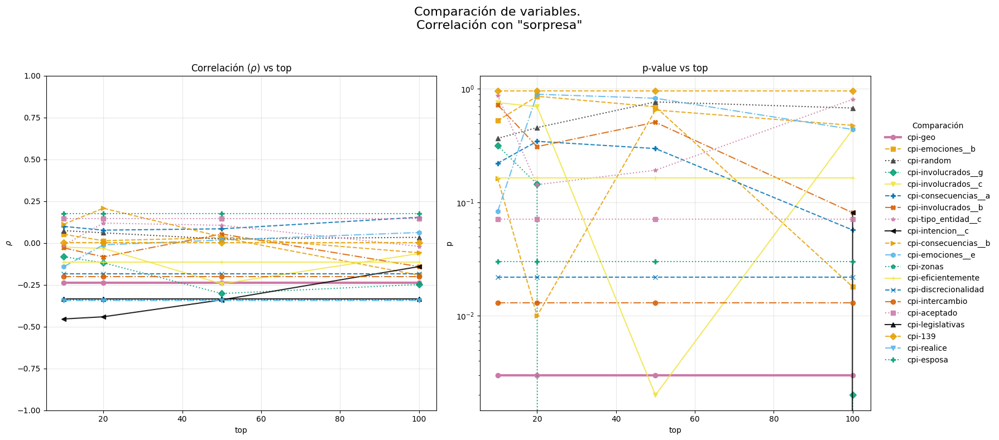

Correlación con tfidf


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


dict_keys(['cpi', 'rankings', 'zonas', 'eficientemente', 'discrecionalidad', 'intercambio', 'aceptado', 'legislativas', '139', 'realice', 'esposa'])


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:1170: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rp_dict.update({source+'-'+k: spearmanr(vect_dict[source], vect_dict[k]) for k in vect_dict if k not in [source] + ignore})


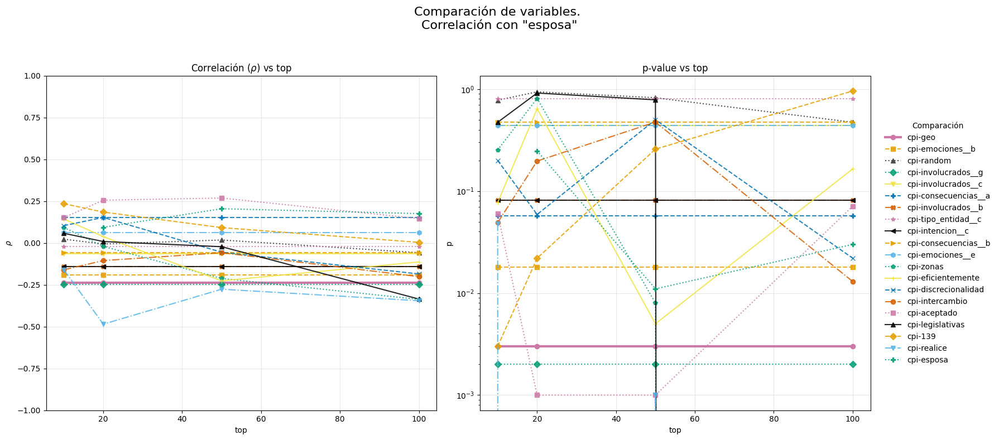

In [15]:
import re

print("Correlación con cuestionario")
_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['cuestionario'],
    expanded=True,
    by='no_filter'
)

relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )

feats = srl.get_most_relevant(
    relevance,
    threshold=0.6,
    by='correlation',
    min_features_ratio=2,
    adaptive_threshold=True
)

clean_feats = list(set([re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", f) for f in feats]))
clean_feats

dict_forms = {
    'consecuencias__b': 'consecuencias no legales',
    'tipo_entidad__c': 'organismo internacional',
    'intencion__c': "tomar acción",
    'consecuencias__a': 'sanciones legales',
    'emociones__b': 'tristeza',
    'involucrados__c': 'empresas',
    'involucrados__b': 'gobierno nacional',
    'involucrados__g': 'tomadores de decisión no gubernamentales',
    'emociones__e': 'sorpresa'
}

feats_corrs = []
thres = {}
aux_dict = df_dict.copy()
for feat in clean_feats:
    aux_dict[feat] = aux_dict['cuestionario'][[feat]].copy()
    thres[feat] = 0.6
for k in ['robertuito', 'tfidf', 'cuestionario']:
    aux_dict.pop(k, None)
print(aux_dict.keys())
    
wide_r, wide_p = srl.compare_research_variables(
    aux_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True
)

feats_corrs.append(['cuestionario', feat] + wide_r[f'cpi-{feat}'].to_list())

srl.graph_comparison(
    wide_r, 
    wide_p,
    extra=f'\nCorrelación con "{dict_forms.get(feat, feat)}"',
    highlight_palette=HIGHLIGHT_COLORS
)



print("Correlación con tfidf")

_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['tfidf'],
    expanded=True,
    by='no_filter'
)

relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )

feats = srl.get_most_relevant(
    relevance,
    threshold=0.6,
    by='correlation',
    min_features_ratio=2,
    adaptive_threshold=True
)

relevance = relevance[relevance['rh']>0.6]
rel = pd.concat([relevance.head(5), relevance.tail(5)])
clean_feats = rel['option'].unique()

thres = {}
aux_dict = df_dict.copy()
for feat in clean_feats:
    aux_dict[feat] = aux_dict['tfidf'][[feat]].copy()
    thres[feat] = 0.6
for k in ['robertuito', 'tfidf', 'cuestionario']:
    aux_dict.pop(k, None)
print(aux_dict.keys())
    
wide_r, wide_p = srl.compare_research_variables(
    aux_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True
)

feats_corrs.append(['tfidf', feat] + wide_r[f'cpi-{feat}'].to_list())

srl.graph_comparison(
    wide_r, 
    wide_p,
    extra=f'\nCorrelación con "{feat}"',
    highlight_palette=HIGHLIGHT_COLORS
)

feats_corrs_df = pd.DataFrame(feats_corrs, columns=['variable', 'caracteristica', '10', '20', '50', '100'])
feats_corrs_df.to_csv('../datos/feats_individual_corr.csv')

# Analisis con caracteristicas mas relevantes

## Binarias
### Todas las caracteristicas

In [14]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )
relevance[relevance['abs_rh'] > 0.6].sort_values('abs_rh', ascending=False).shape

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


(30, 8)

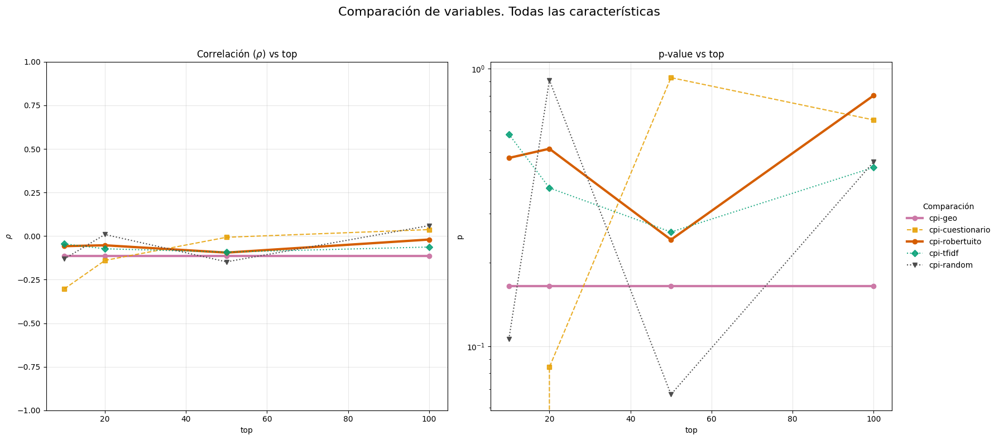

In [31]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True
)

srl.graph_comparison(
    wide_r, 
    wide_p,
    extra='Todas las características',
    highlight_palette=HIGHLIGHT_COLORS
)

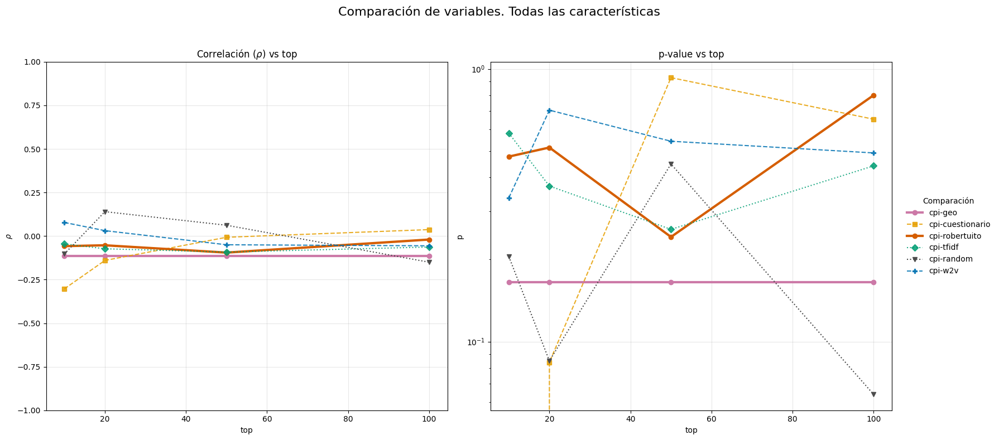

In [19]:
thres['w2v'] = 0.6
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True
)

srl.graph_comparison(
    wide_r, 
    wide_p,
    extra='Todas las características',
    highlight_palette=HIGHLIGHT_COLORS
)

### Comparacion contra CPI vs rango

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 20). Ajustando a 0.4004.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 20). Ajustando a 0.4191.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 20). Ajustando a 0.5121.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

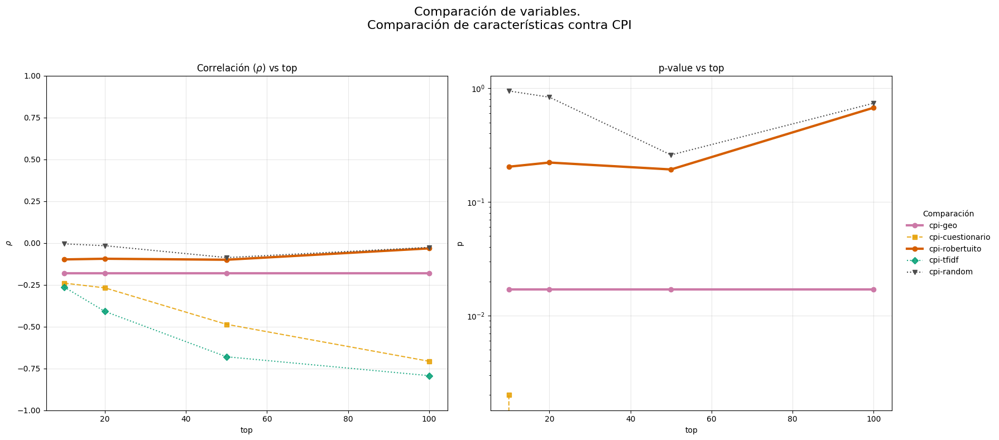

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 20). Ajustando a 0.4004.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 20). Ajustando a 0.4191.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 20). Ajustando a 0.5121.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

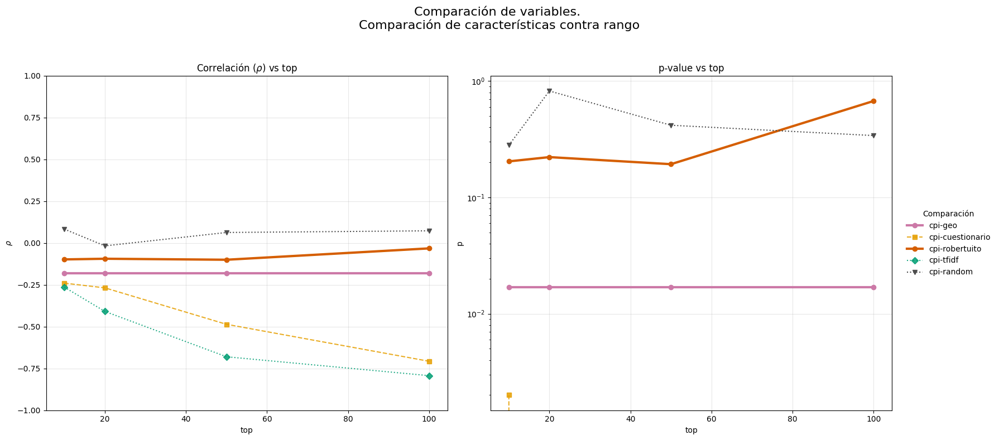

In [12]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nComparación de características contra CPI",
    highlight_palette=HIGHLIGHT_COLORS
)

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['rank']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nComparación de características contra rango",
    highlight_palette=HIGHLIGHT_COLORS
)

### Comparacion segmentos vs promedio

Comparación con segmentos


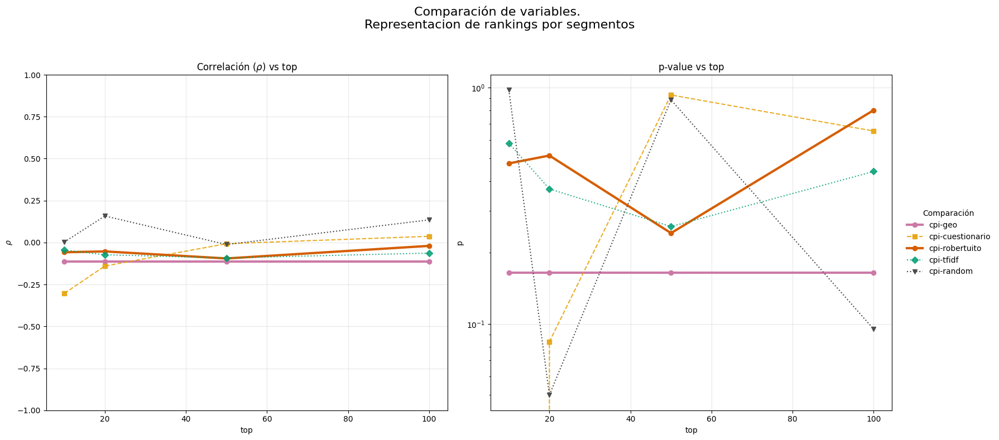

Comparación con promedio


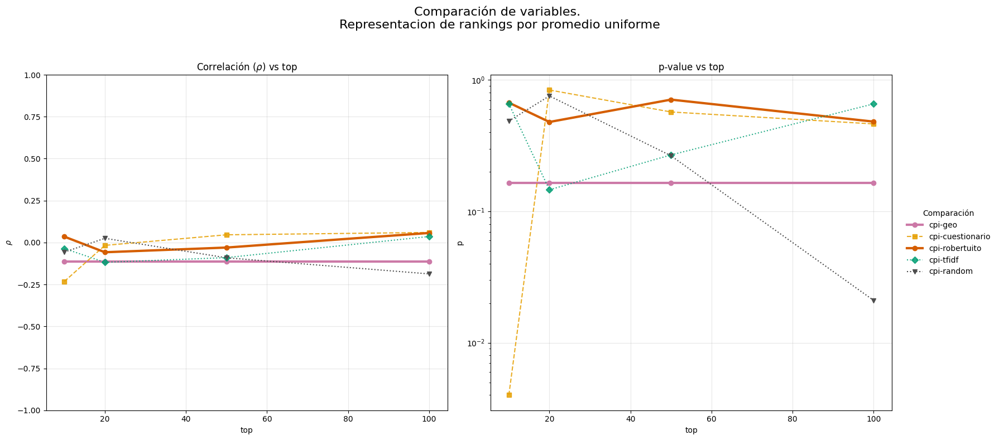

Comparación con promedio ponderado (1/rank)


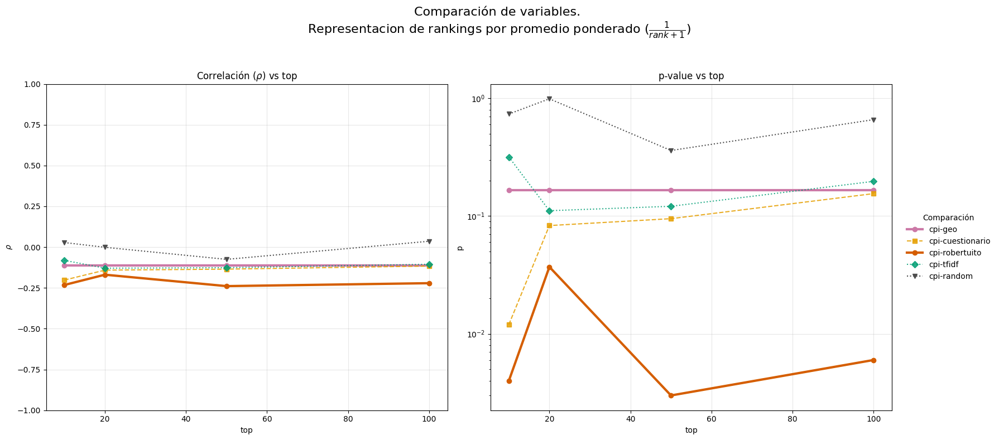

Comparación con promedio ponderado (1/log(rank))


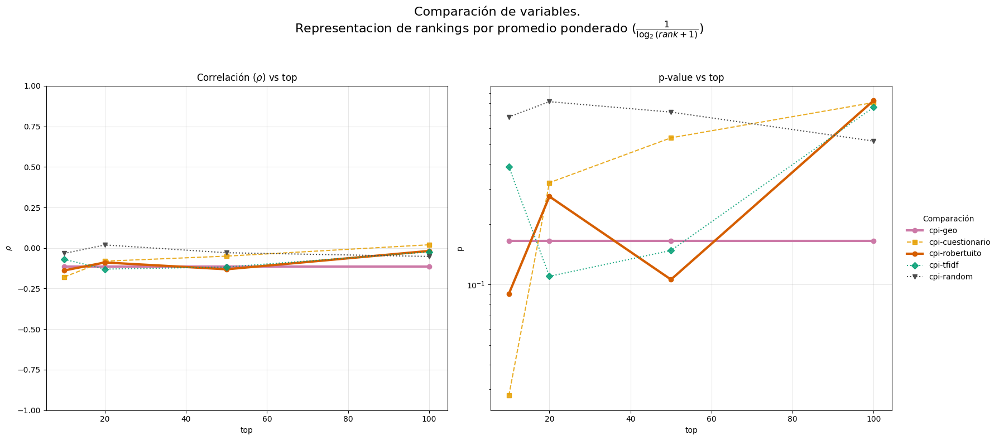

In [32]:
print("Comparación con segmentos")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por segmentos",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1,
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por promedio uniforme",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/rank)")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1/(rank+1),
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{rank+1}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/log(rank))")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{\log_2(rank+1)}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

Comparación con segmentos


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: A

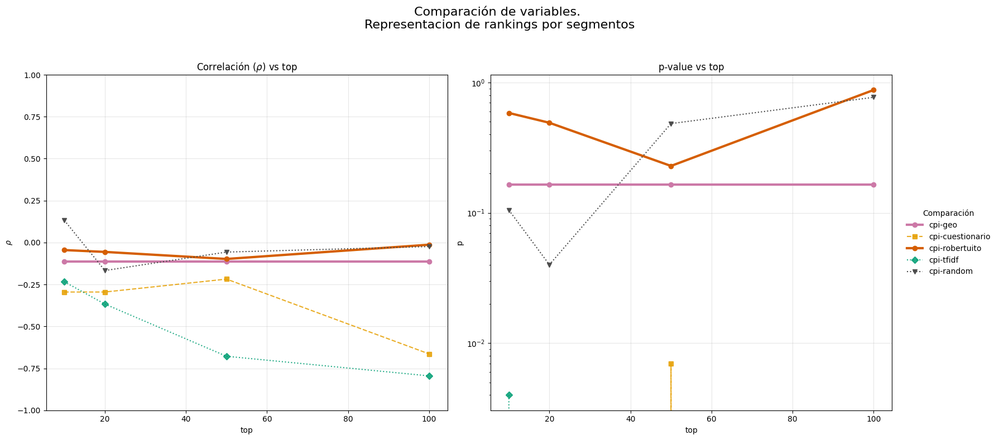

Comparación con promedio
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5290 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4121 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4743 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5499 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


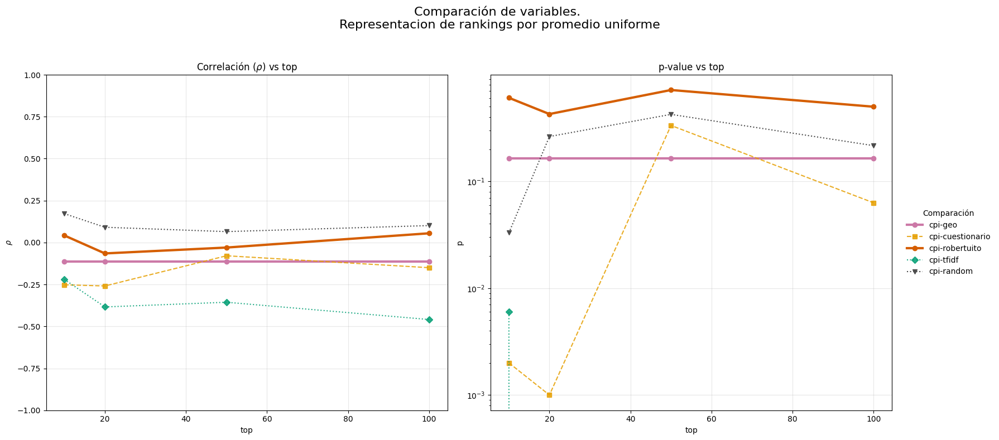

Comparación con promedio ponderado (1/rank)
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5968.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4716 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5238 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5294.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


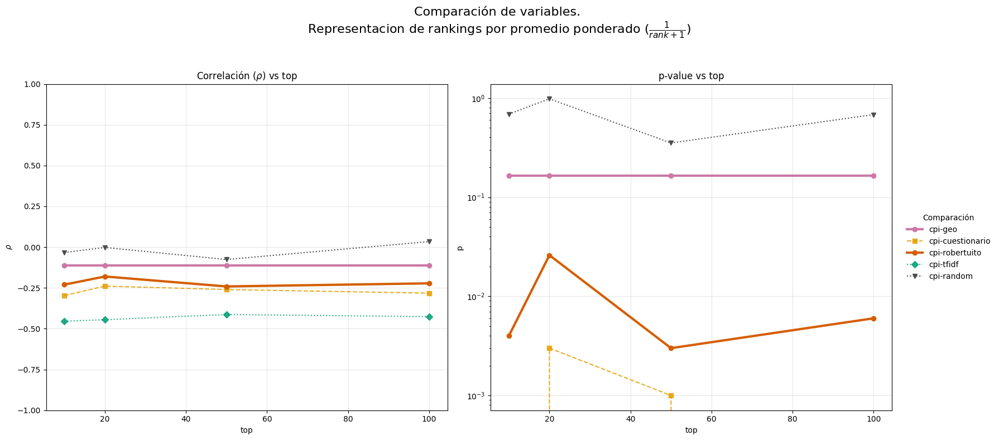

Comparación con promedio ponderado (1/log(rank))
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4861 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4478 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5142.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5955.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


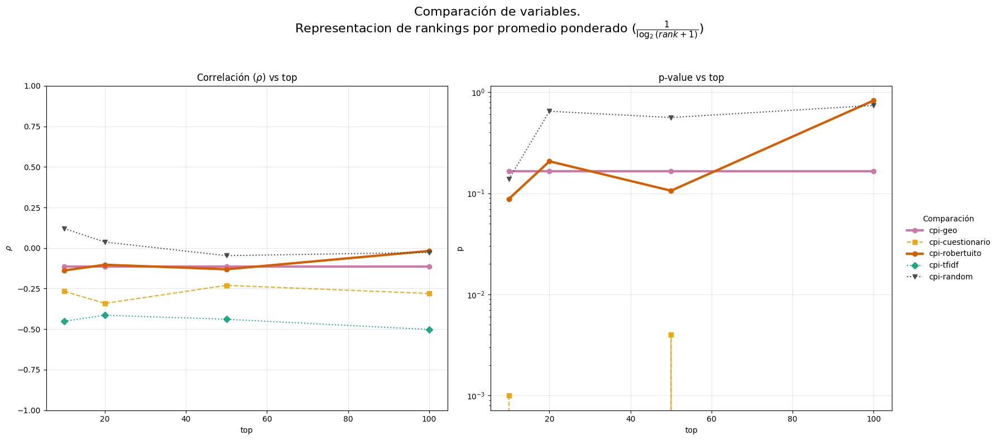

In [33]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}

min_feats = 2
print("Comparación con segmentos")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=min_feats
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por segmentos",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1,
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=min_feats
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio uniforme",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/rank)")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1/(rank+1),
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=min_feats
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{rank+1}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/log(rank))")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1/np.log2(rank+1),
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=min_feats
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = '\n' + r"Representacion de rankings por promedio ponderado ($\frac{1}{\log_2(rank+1)}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

### Relacion por distancia vs correlacion

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: A

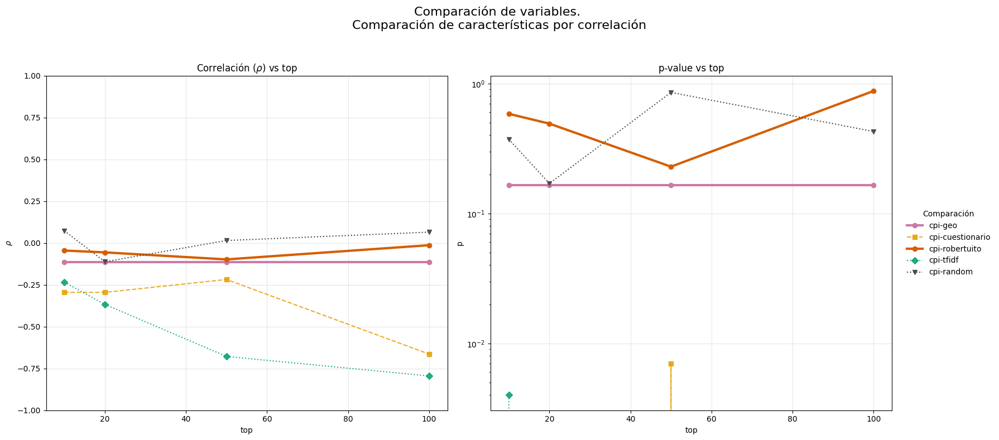

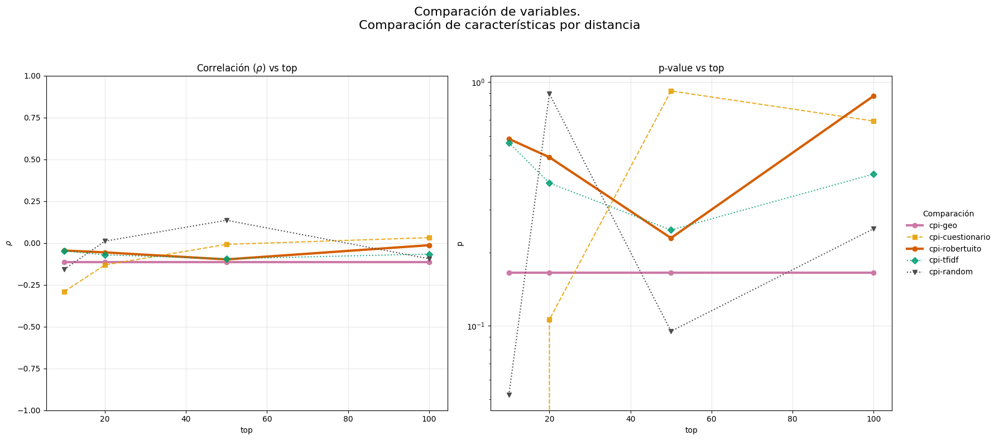

In [34]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
# CORRELACION
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nComparación de características por correlación',
    highlight_palette=HIGHLIGHT_COLORS
)

# DISTANCIA
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nComparación de características por distancia',
    highlight_palette=HIGHLIGHT_COLORS
)

In [ ]:
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}

t = 0.9
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.9",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

t = 0.75
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.75",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

t = 0.3
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.3",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

KeyboardInterrupt: 

### Mezclas de filtrados

#### Un filtro

##### Correlacion (final)

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

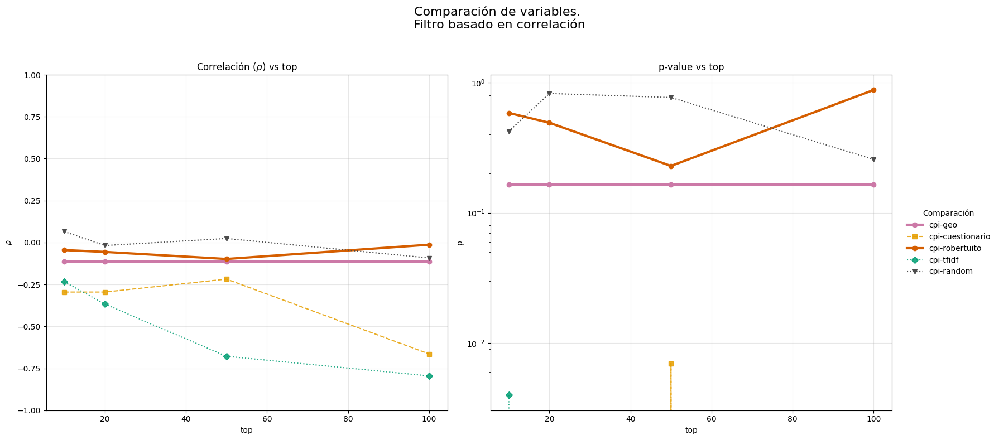

In [12]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.001
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nFiltro basado en correlación',
    highlight_palette=HIGHLIGHT_COLORS
)

##### MI sobre dataset completo
###### Top global

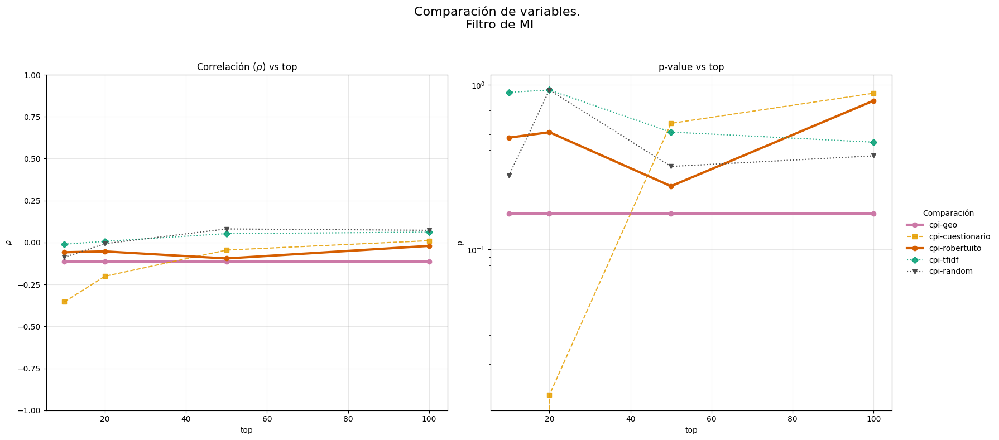

In [22]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro de MI",
    highlight_palette=HIGHLIGHT_COLORS
)

##### MI crossval
###### Score > 0.8

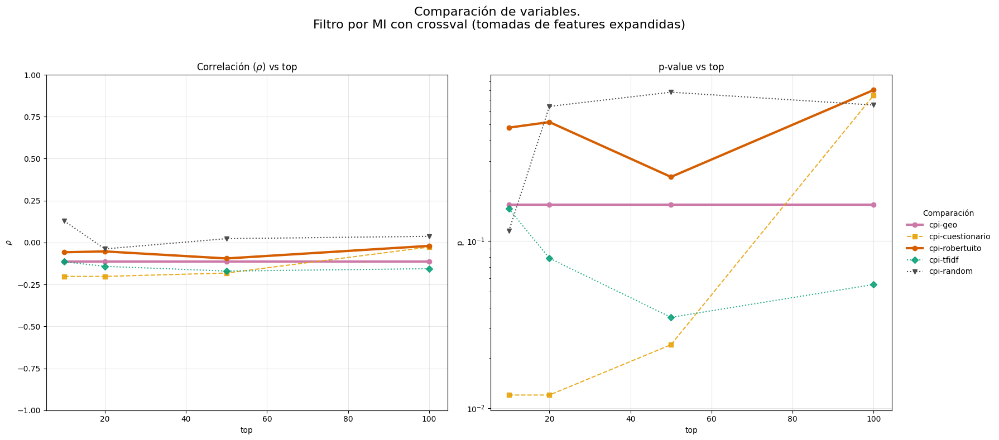

In [34]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    #print_progress=True,
    take_from_expanded_feats=take_from_expanded_dict
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features expandidas)",
    highlight_palette=HIGHLIGHT_COLORS
)

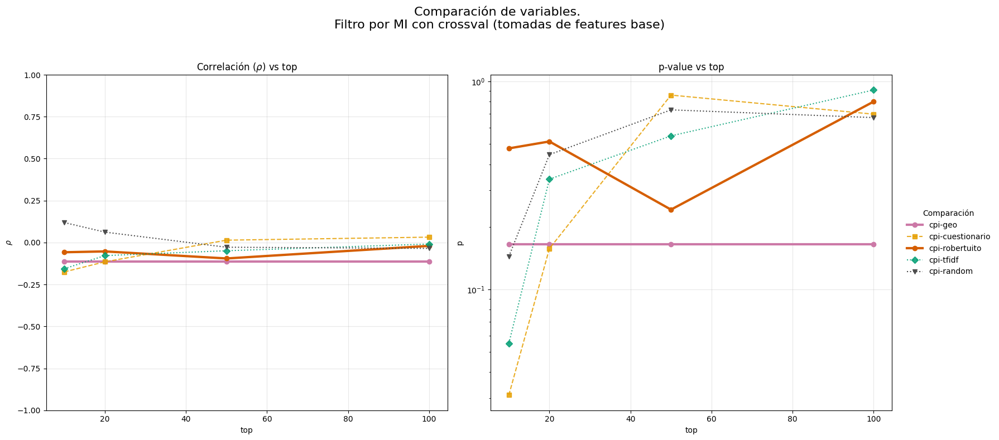

In [37]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    #print_progress=True,
    #take_from_expanded_feats=take_from_expanded_dict
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features base)",
    highlight_palette=HIGHLIGHT_COLORS
)

###### Tasa de seleccion

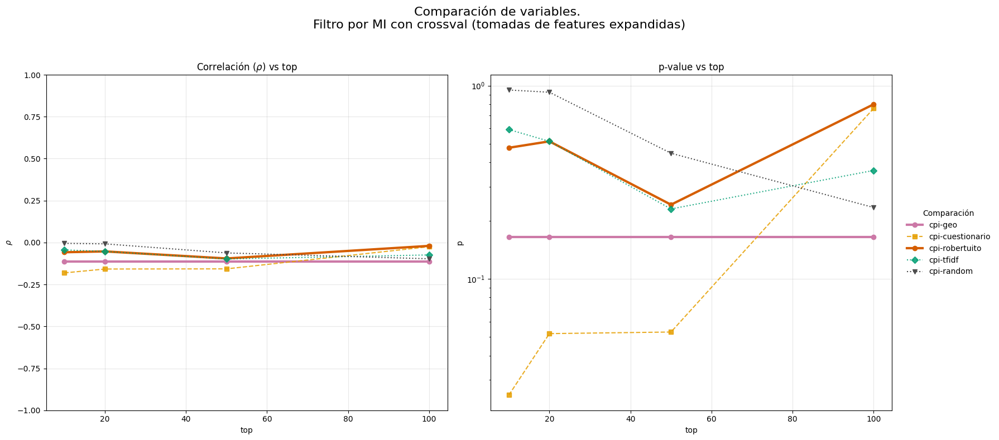

In [46]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    #print_progress=True,
    take_from_expanded_feats=take_from_expanded_dict
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features expandidas)",
    highlight_palette=HIGHLIGHT_COLORS
)

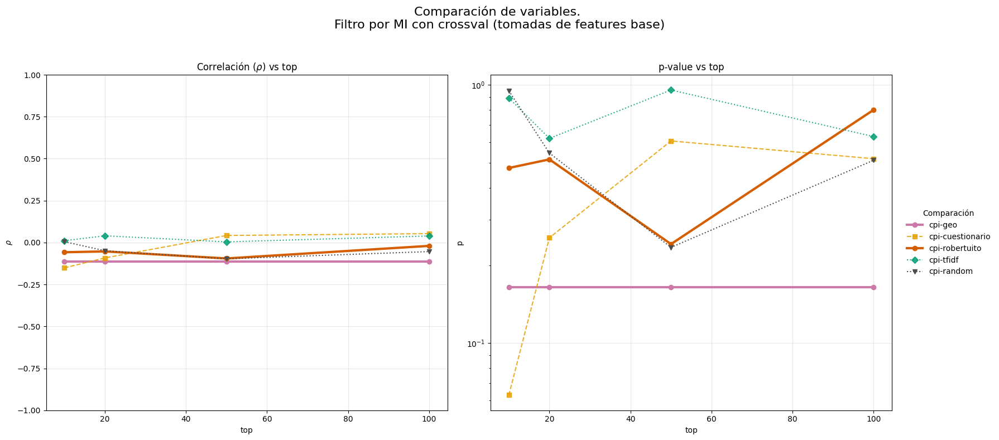

In [43]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    #print_progress=True,
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features base)",
    highlight_palette=HIGHLIGHT_COLORS
)

#### Dos filtros

##### MI sobre dataset completo + correlacion (final)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3974 para mantener 2 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2936 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4632 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4394 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5341 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5211 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5509.


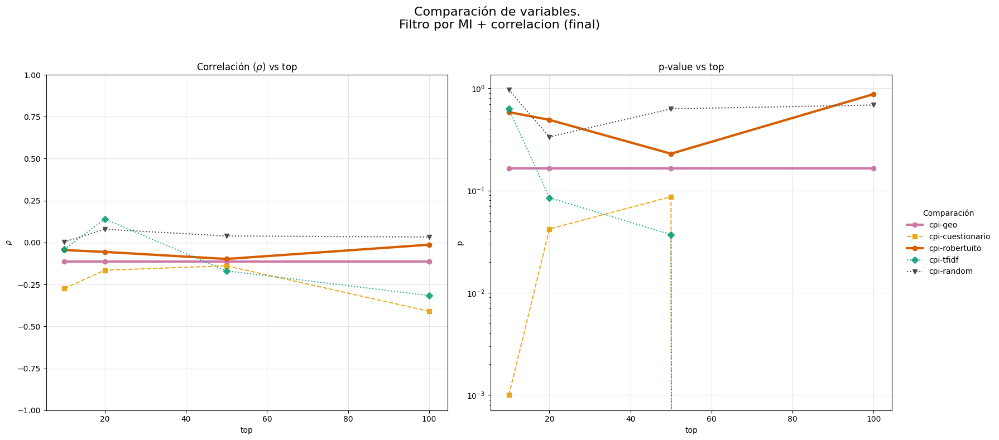

In [23]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI + correlacion (final)",
    highlight_palette=HIGHLIGHT_COLORS
)

##### Similitud de W2V + correlacion (final)

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5969.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

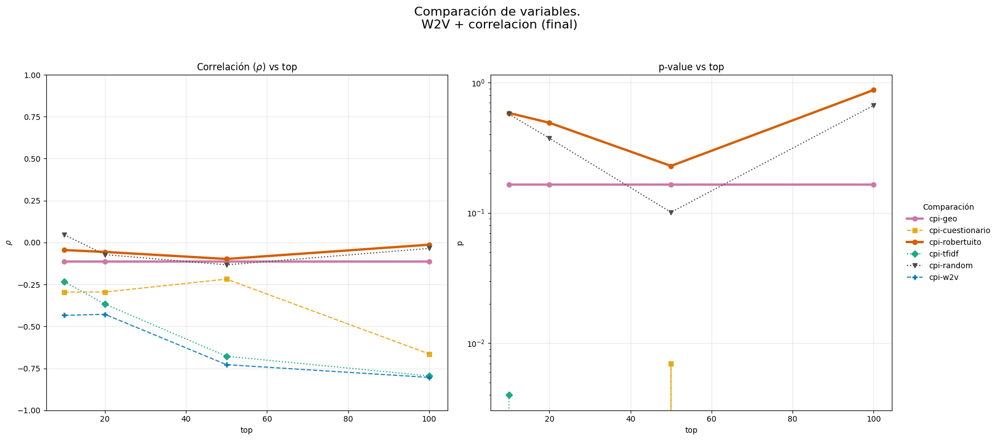

In [15]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t,
    'w2v': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nW2V + correlacion (final)",
    highlight_palette=HIGHLIGHT_COLORS
)

In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['w2v'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )
relevance[relevance['abs_rh']>0.6].head(50)

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


,feature,rh,p,n,target,statistic,abs_rh,option
0,etica gubernamental_delta_cum_s9,0.843072,0.000006,19,cpi,delta_cum,0.843072,etica gubernamental
1,etica gubernamental_cum_s8,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
2,etica gubernamental_cum_s9,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
3,etica gubernamental_delta_cum_s10,0.813663,0.000023,19,cpi,delta_cum,0.813663,etica gubernamental
4,social corrupcion_cum_s7,-0.812281,0.000024,19,cpi,cum,0.812281,social corrupcion
...,...,...,...,...,...,...,...,...
215,corrupcion practicas_cum_s9,-0.600527,0.006552,19,cpi,cum,0.600527,corrupcion practicas
216,asociados corrupcion_diff_s4,-0.600433,0.006563,19,cpi,diff,0.600433,asociados corrupcion
217,corrupcion constituye_mean_s8,0.600141,0.006596,19,cpi,mean,0.600141,corrupcion constituye
218,corrupcion constituye_std_s8,0.600141,0.006596,19,cpi,std,0.600141,corrupcion constituye


In [19]:
relevance[relevance['abs_rh']>0.6].head(50)

,feature,rh,p,n,target,statistic,abs_rh,option
0,etica gubernamental_delta_cum_s9,0.843072,0.000006,19,cpi,delta_cum,0.843072,etica gubernamental
1,etica gubernamental_cum_s8,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
2,etica gubernamental_cum_s9,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
3,etica gubernamental_delta_cum_s10,0.813663,0.000023,19,cpi,delta_cum,0.813663,etica gubernamental
4,social corrupcion_cum_s7,-0.812281,0.000024,19,cpi,cum,0.812281,social corrupcion
5,corrupcion gubernamental_cum_s10,-0.798246,0.000042,19,cpi,cum,0.798246,corrupcion gubernamental
6,corrupcion sino_diff_s6,-0.783832,0.000072,19,cpi,diff,0.783832,corrupcion sino
7,corrupcion gubernamental_delta_cum_s9,0.765921,0.000132,19,cpi,delta_cum,0.765921,corrupcion gubernamental
8,corrupcion gubernamental_cum_s8,-0.765921,0.000132,19,cpi,cum,0.765921,corrupcion gubernamental
9,corrupcion gubernamental_cum_s9,-0.765921,0.000132,19,cpi,cum,0.765921,corrupcion gubernamental


In [20]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['tfidf'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )
relevance[relevance['abs_rh']>0.6].head(50)

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


,feature,rh,p,n,target,statistic,abs_rh,option
0,eficientemente_delta_cum_s3,0.860904,0.000002,19,cpi,delta_cum,0.860904,eficientemente
1,discrecionalidad_delta_cum_s8,0.859649,0.000002,19,cpi,delta_cum,0.859649,discrecionalidad
2,zonas_delta_cum_s10,0.857895,0.000003,19,cpi,delta_cum,0.857895,zonas
3,complicidad_diff_s9,-0.852374,0.000004,19,cpi,diff,0.852374,complicidad
4,dominacion_diff_s9,-0.851769,0.000004,19,cpi,diff,0.851769,dominacion
5,referirse_std_s6,-0.848923,0.000004,19,cpi,std,0.848923,referirse
6,etica gubernamental_delta_cum_s9,0.843072,0.000006,19,cpi,delta_cum,0.843072,etica gubernamental
7,etica gubernamental_cum_s8,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
8,etica gubernamental_cum_s9,-0.843072,0.000006,19,cpi,cum,0.843072,etica gubernamental
9,referirse_mean_s6,-0.837541,0.000008,19,cpi,mean,0.837541,referirse


In [21]:
relevance[relevance['abs_rh']>0.6].shape

(3910, 8)

##### Correlacion + MI sobre dataset completo

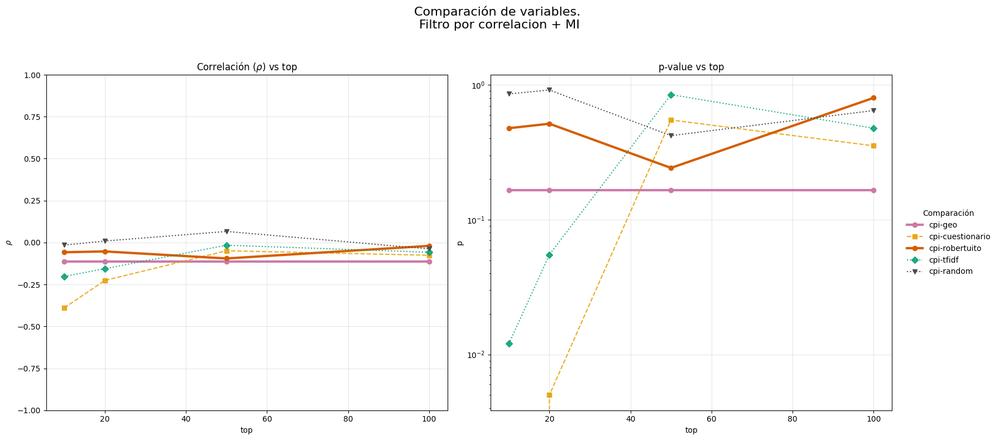

In [27]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nFiltro por correlacion + MI',
    highlight_palette=HIGHLIGHT_COLORS
)

##### MI crossval + correlacion (final)
###### Score > 0.8

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 1 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4314 para mantener 1 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4428 para mantener 1 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4071 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4071 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


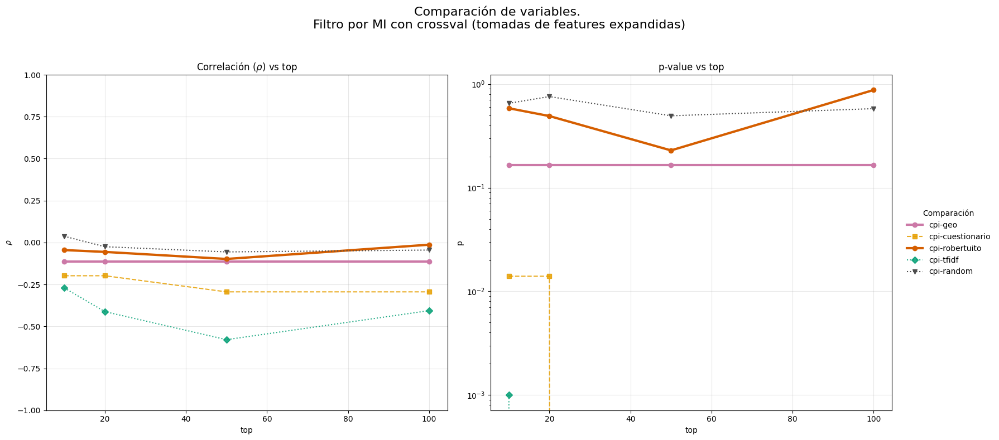

In [33]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    take_from_expanded_feats=take_from_expanded_dict,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.0001
    
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features expandidas)",
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5529 para mantener 1 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4632 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5967 para mantener 2 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4632 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5431 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


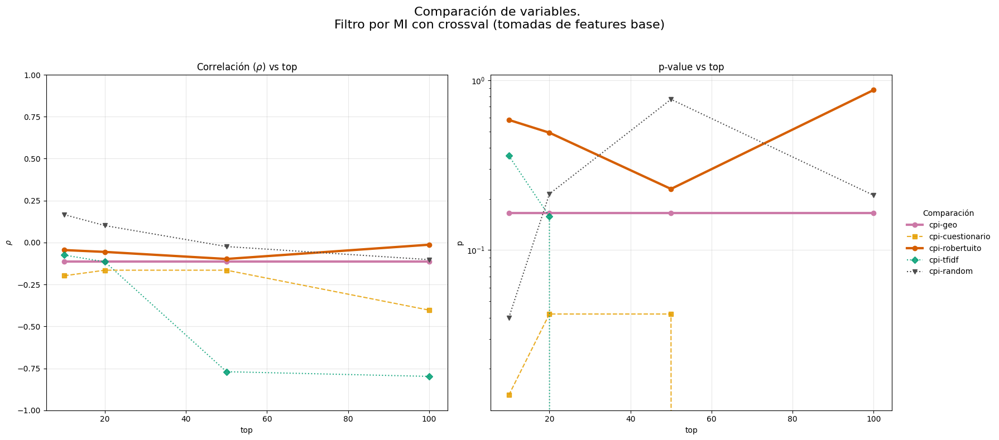

In [38]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.001
    
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features base)",
    highlight_palette=HIGHLIGHT_COLORS
)

###### Tasa de seleccion (forms>=0.8, tfidf==0.4 (max))

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 1 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2545 para mantener 8 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3343 para mantener 10 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4041 para mantener 3 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4313 para mantener 12 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 5). Ajustando a 0.3817.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4311 para mantener 13 características.


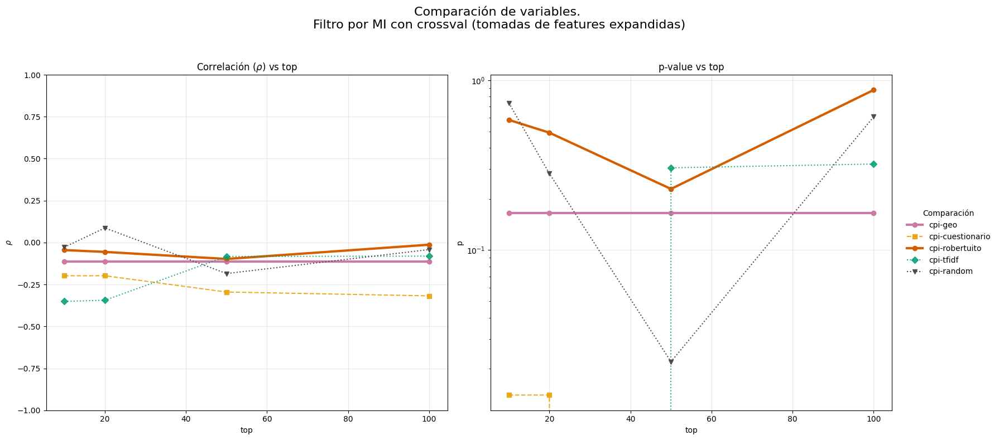

In [47]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    take_from_expanded_feats=take_from_expanded_dict,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.1
    
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features expandidas)",
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3973 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4271 para mantener 5 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4632 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5285 para mantener 10 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4632 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 15 características (mínimo deseado: 27). Ajustando a 0.5531.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


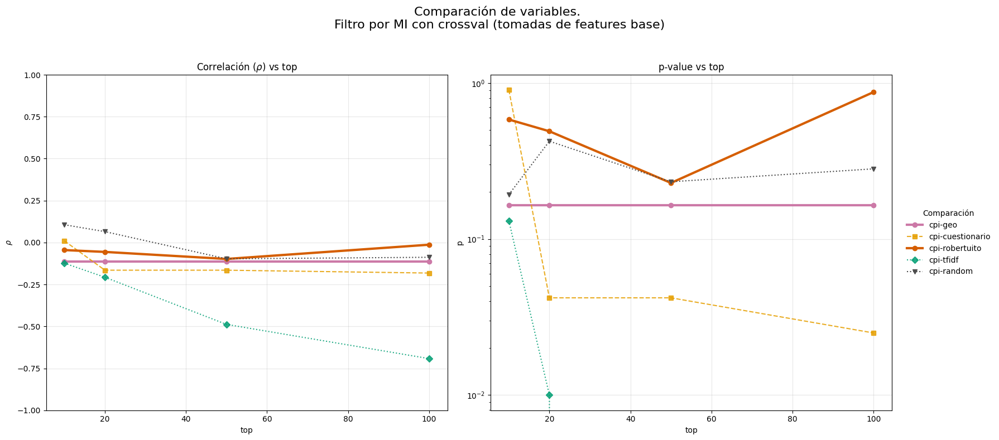

In [42]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.01
    
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="\nFiltro por MI con crossval (tomadas de features base)",
    highlight_palette=HIGHLIGHT_COLORS
)

#### Tres filtros

##### Correlacion + MI sobre dataset completo + correlacion (final)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4176 para mantener 6 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 9). Ajustando a 0.4314.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3974 para mantener 13 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 19). Ajustando a 0.4297.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3974 para mantener 32 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 47). Ajustando a 0.4128.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 15 características (mínimo deseado: 65). Ajustando a 0.4270.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 95). Ajustando a 0.4109.


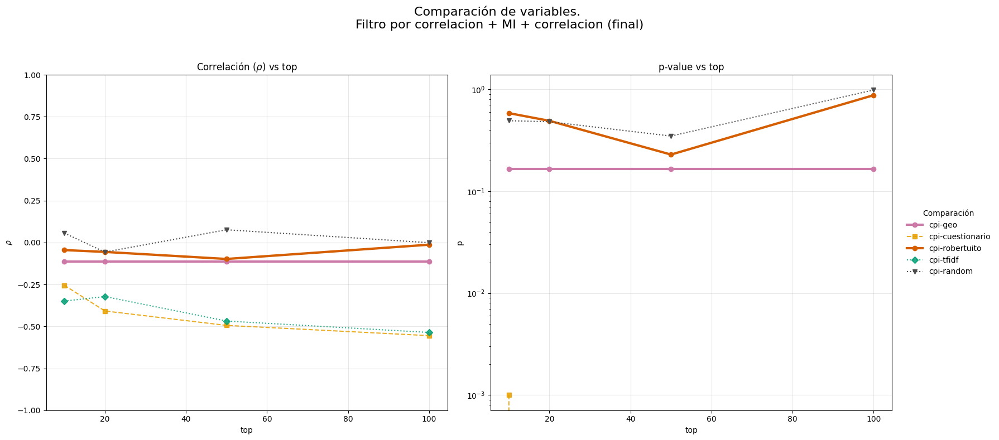

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 3 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 3). Ajustando a 0.4978.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 3 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 3). Ajustando a 0.4978.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 3 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:816: ConstantInputWarning: A

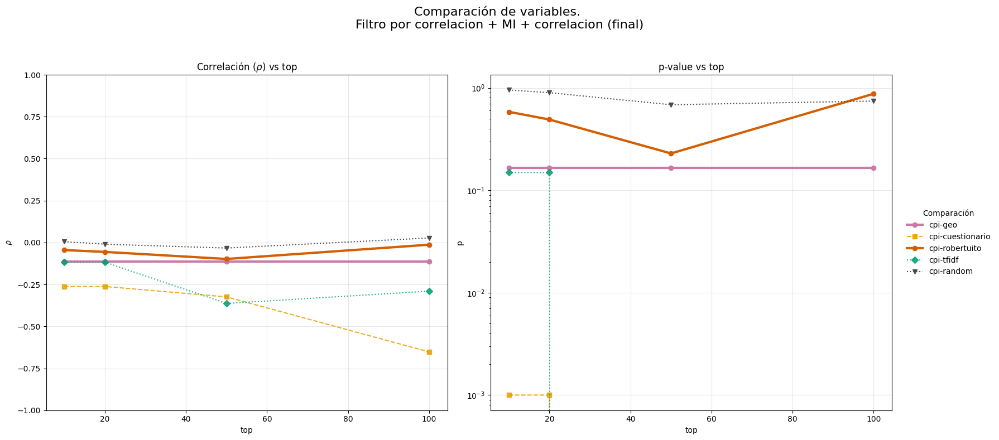

In [28]:
# CON FILTRO DE CORRELACION PREVIO
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.1
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nFiltro por correlacion + MI + correlacion (final)',
    highlight_palette=HIGHLIGHT_COLORS
)

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=3
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra='\nFiltro por correlacion + MI + correlacion (final)',
    highlight_palette=HIGHLIGHT_COLORS
)

### Solo mas relevantes
#### umbral = 0.6

In [129]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'][list(range(10))], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target
0,intencion__c_std_s1,0.522422,0.026136,18,NaN,cpi
1,localidad_problema__b_mean_s1,0.504231,0.032860,18,NaN,cpi
2,localidad_problema__b_cum_s1,0.504231,0.032860,18,NaN,cpi
3,intencion__c_mean_s1,0.463086,0.052947,18,NaN,cpi
4,intencion__c_cum_s1,0.463086,0.052947,18,NaN,cpi
...,...,...,...,...,...,...
265,involucrados__h_delta_cum_s1,NaN,NaN,18,NaN,cpi
266,emociones__a_delta_cum_s1,NaN,NaN,18,NaN,cpi
267,emociones__b_delta_cum_s1,NaN,NaN,18,NaN,cpi
268,emociones__c_delta_cum_s1,NaN,NaN,18,NaN,cpi


Procesando top 10...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3901 para mantener 26 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2576 para mantener 74 características.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 10 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   10
1  cpi-cuestionario  0.395  0.000   10
2    cpi-robertuito  0.051  0.528   10
3           cpi-bow  0.050  0.536   10
4        cpi-random  0.116  0.153   10

Procesando top 20...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3523 para mantener 52 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 149). Ajustando a 0.3420.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 20 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   20
1  cpi-cuestionario  0.436  0.000   20
2    cpi-robertuito  0.066  0.417   20
3           cpi-bow  0.166  0.040   20
4        cpi-random  0.074  0.363   20

Procesando top 50...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 130). Ajustando a 0.3817.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 14 características (mínimo deseado: 372). Ajustando a 0.3748.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 50 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   50
1  cpi-cuestionario  0.464  0.000   50
2    cpi-robertuito  0.103  0.204   50
3           cpi-bow  0.376  0.000   50
4        cpi-random -0.204  0.011   50

Procesando top 100...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 22 características (mínimo deseado: 260). Ajustando a 0.3974.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 151 características (mínimo deseado: 745). Ajustando a 0.4129.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 100 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125  100
1  cpi-cuestionario  0.482  0.000  100
2    cpi-robertuito  0.016  0.846  100
3           cpi-bow  0.471  0.000  100
4        cpi-random  0.106  0.190  100

Combinando resultados de todos los tops...


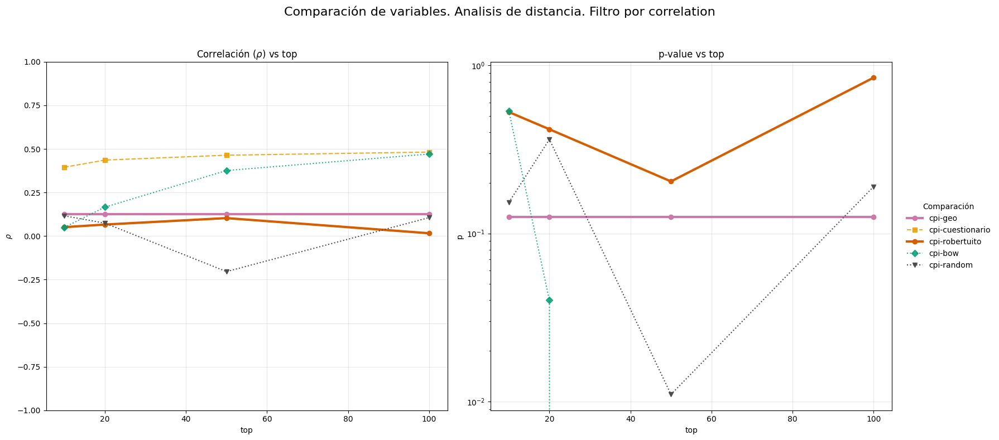

In [42]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=True,
    min_features_ratio=0.1
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

In [93]:
thres_aux = {
    'cuestionario': 0.5,
    'robertuito': 0,
    'tfidf': 0.5
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

KeyboardInterrupt: 

#### umbral = 0.65

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

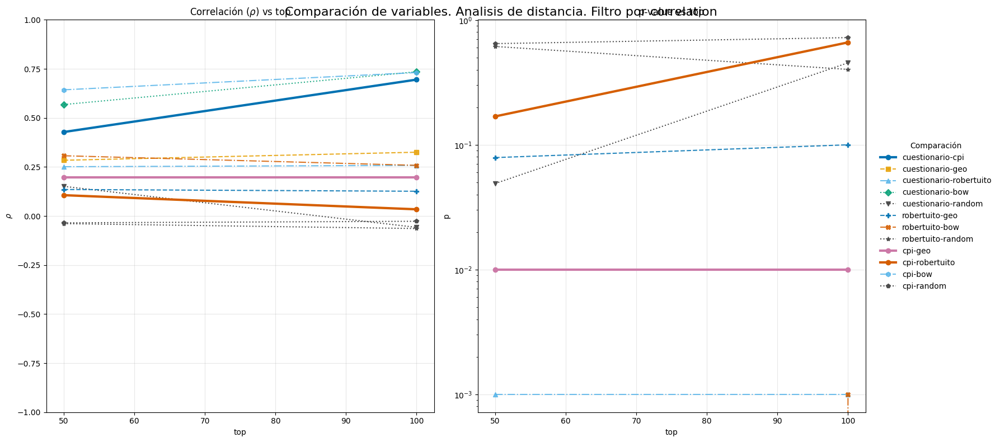

In [ ]:
thres_aux = {
    'cuestionario': 0.65,
    'robertuito': 0,
    'tfidf': 0.65
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### umbral = 0.72

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


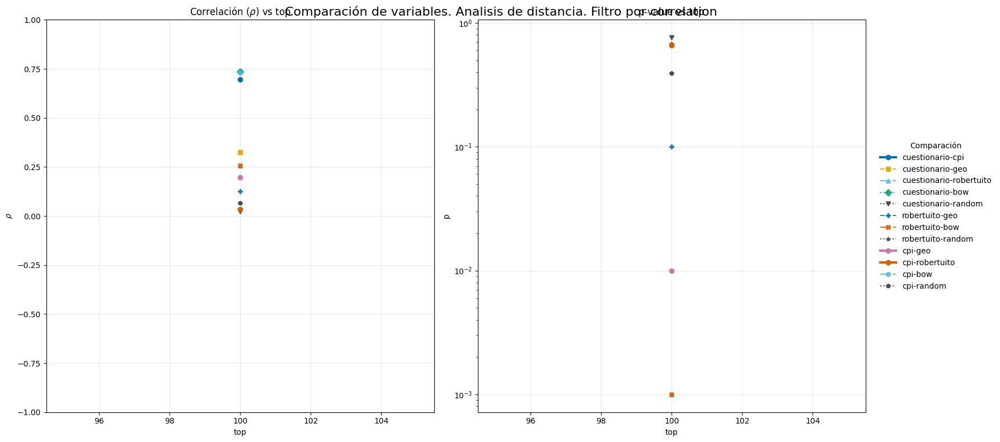

In [ ]:
thres_aux = {
    'cuestionario': 0.72,
    'robertuito': 0,
    'tfidf': 0.72
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

### Top k por estadistico

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

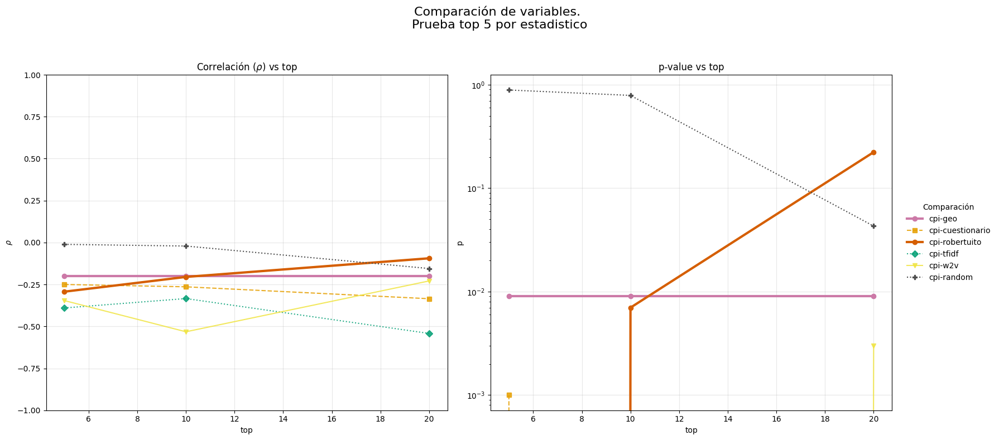

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

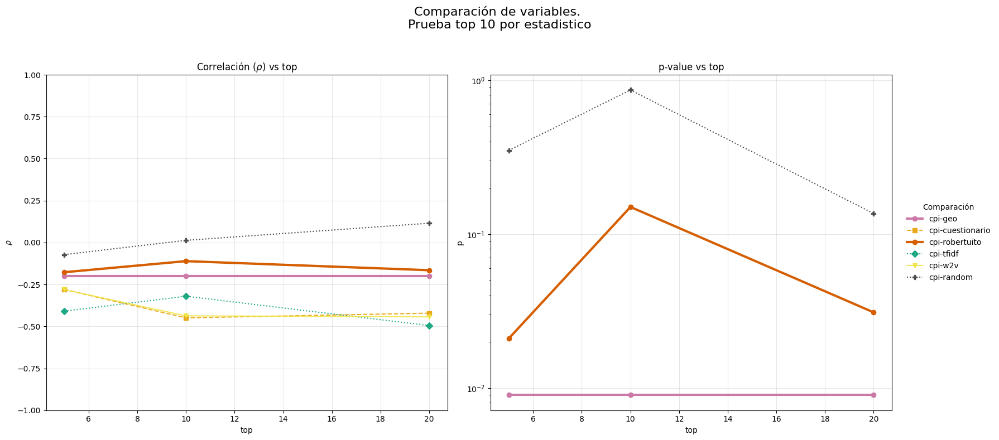

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

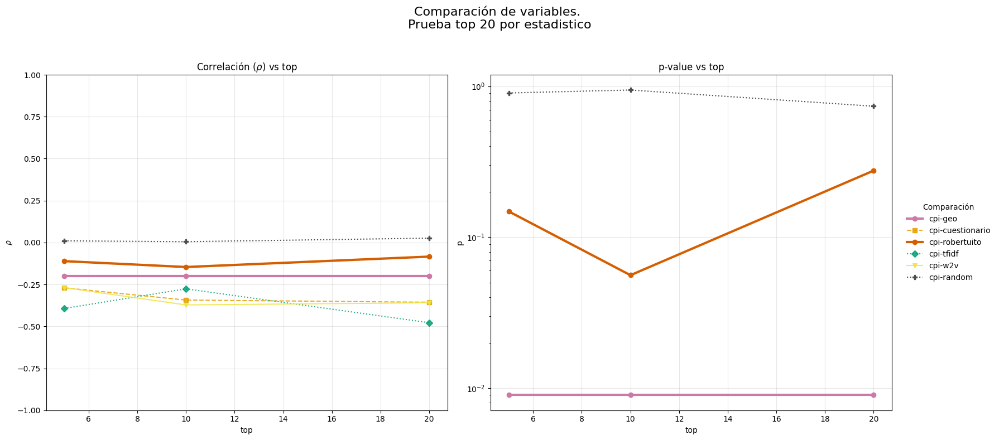

In [12]:
thres['w2v'] = 0.6

tops = [5, 10, 20]
for top in tops:
    wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='top_k_by_statistic',
    k=top,
    compare_to=df_dict["cpi"][['cpi']],
    adaptive_threshold=False
    #print_progress=True,
    #min_features_ratio=2
)

    srl.graph_comparison(
        wide_r, 
        wide_p,
        extra=f'\nPrueba top {top} por estadistico',
        highlight_palette=HIGHLIGHT_COLORS
    )

### Word2Vec

#### Original

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

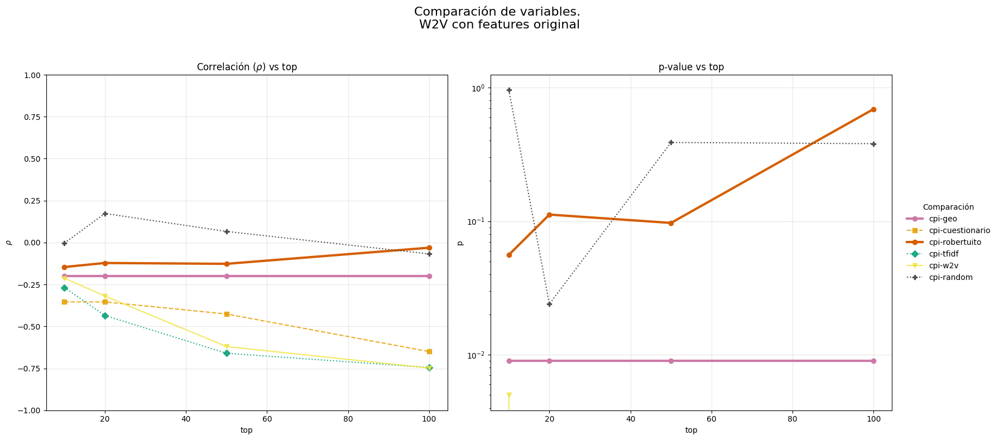

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

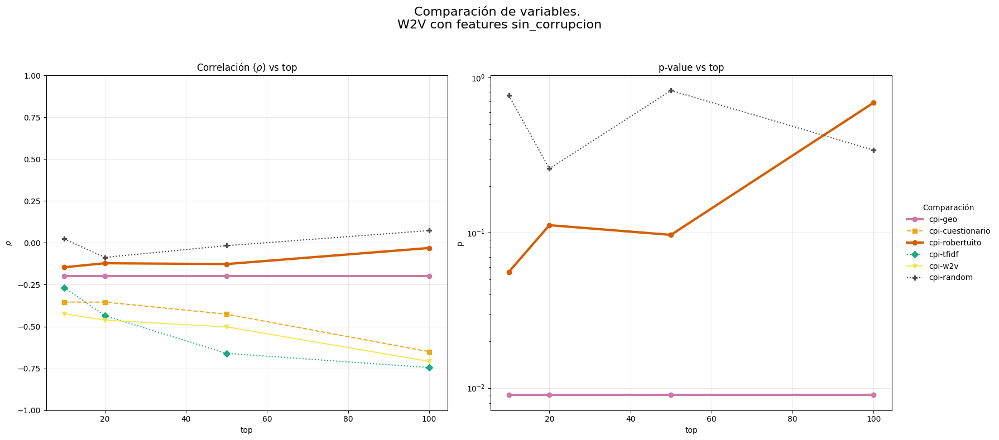

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

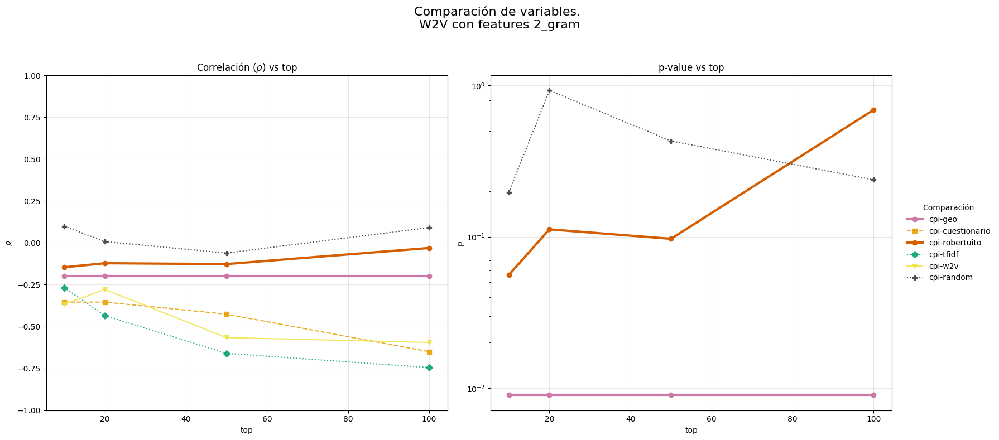

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

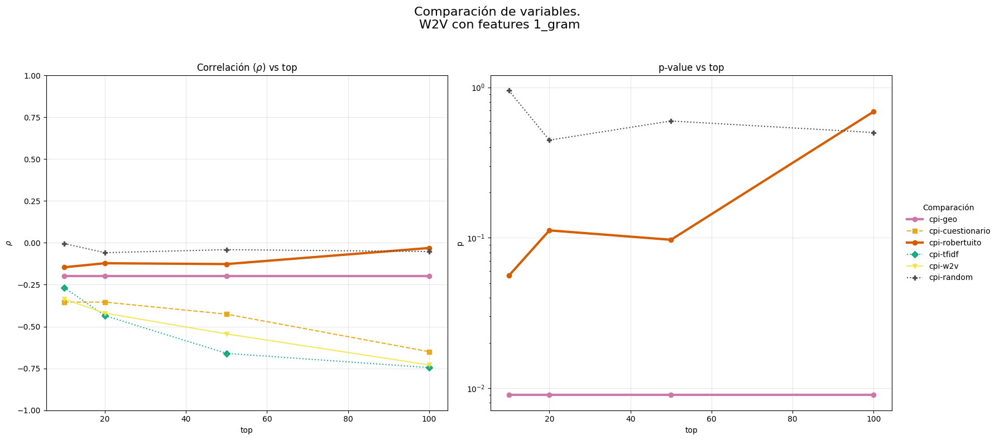

In [49]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t,
    'w2v': t
}
# CORRELACION
for w2v_feats in feats_w2v.columns:
    df_dict['w2v'] = df_dict['tfidf'][feats_w2v[w2v_feats]]
    wide_r, wide_p = srl.compare_research_variables(
        df_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='correlation',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=2
    )
    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra='\nW2V con features ' + w2v_feats,
        highlight_palette=HIGHLIGHT_COLORS
    )

### Ablacion estadisticos

#### Sin 1 estadistico

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

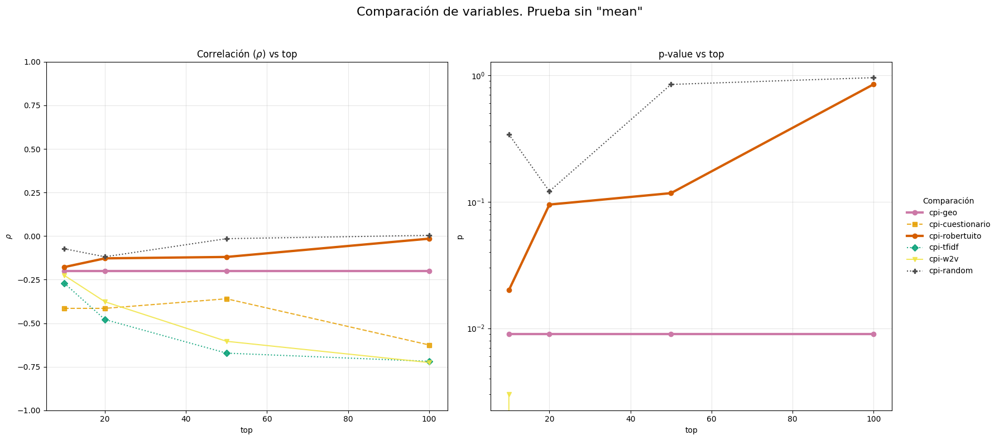

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

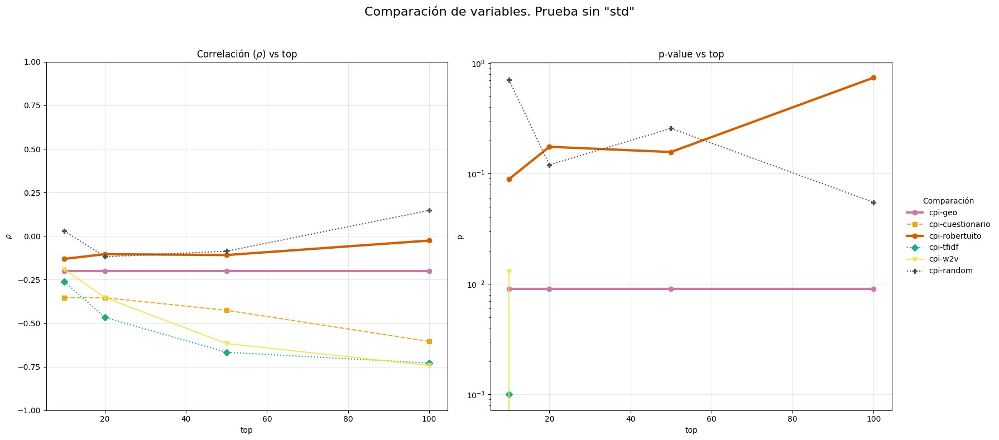

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

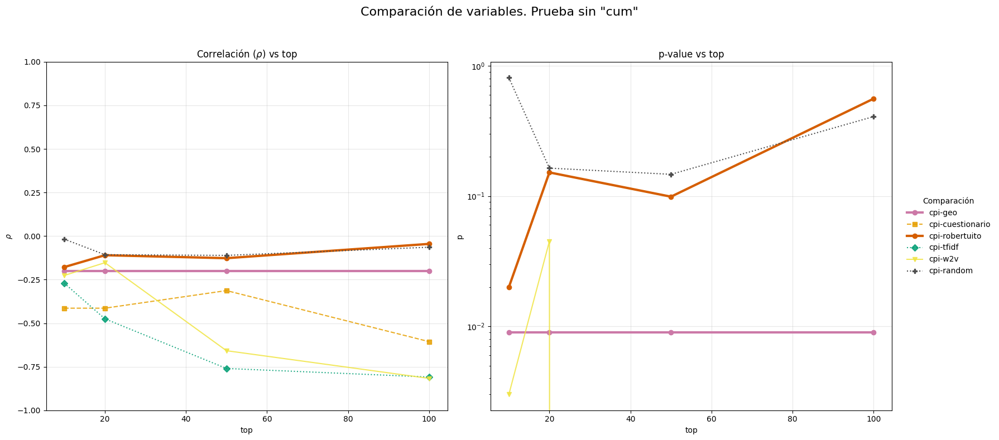

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

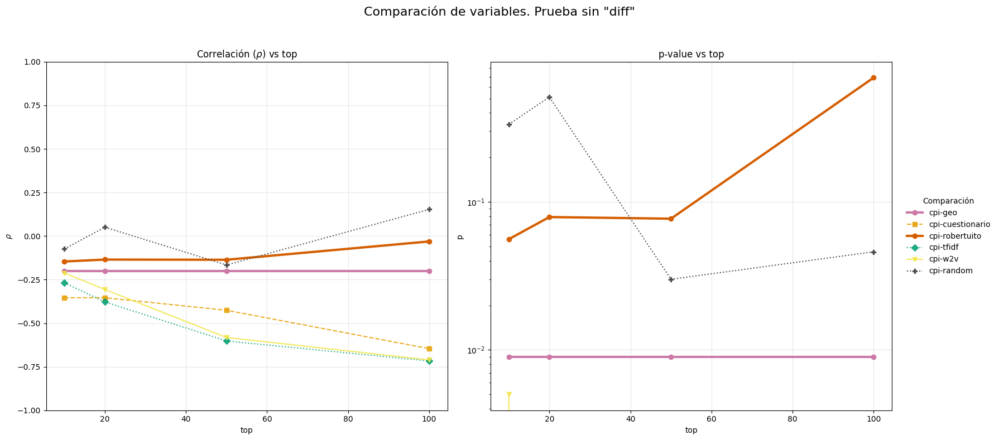

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

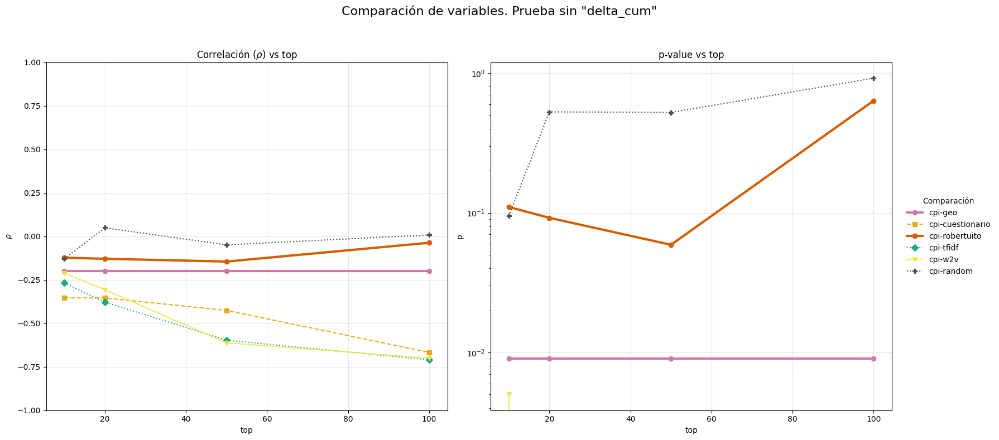

In [25]:
thres['w2v'] = 0.6

stats = ['mean', 'std', 'cum', 'diff', 'delta_cum']
for stat in stats:
    aux_stats = stats.copy()
    aux_stats.remove(stat)
    wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    take_statistics=aux_stats,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)

    srl.graph_comparison(
        wide_r, 
        wide_p,
        extra=f'Prueba sin "{stat}"',
        highlight_palette=HIGHLIGHT_COLORS
    )

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

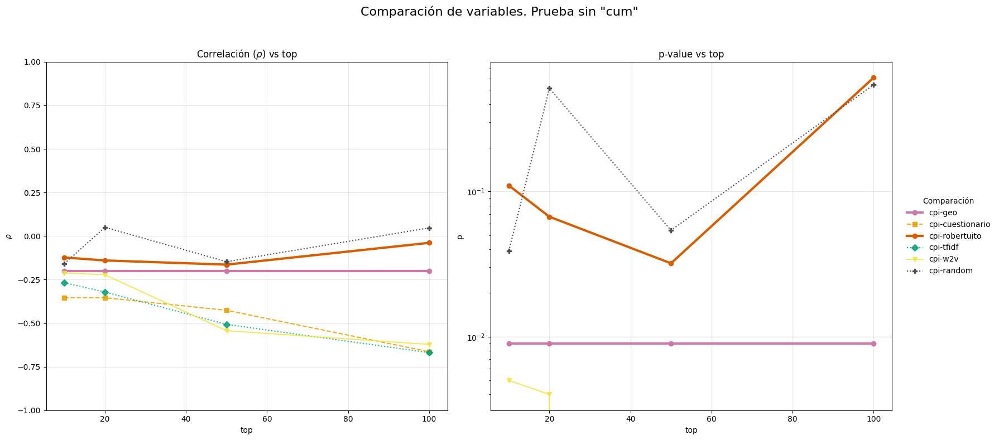

In [27]:
stats = ['mean', 'std', 'cum']
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    take_statistics=stats,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)

srl.graph_comparison(
    wide_r, 
    wide_p,
    extra=f'Prueba sin "{stat}"',
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

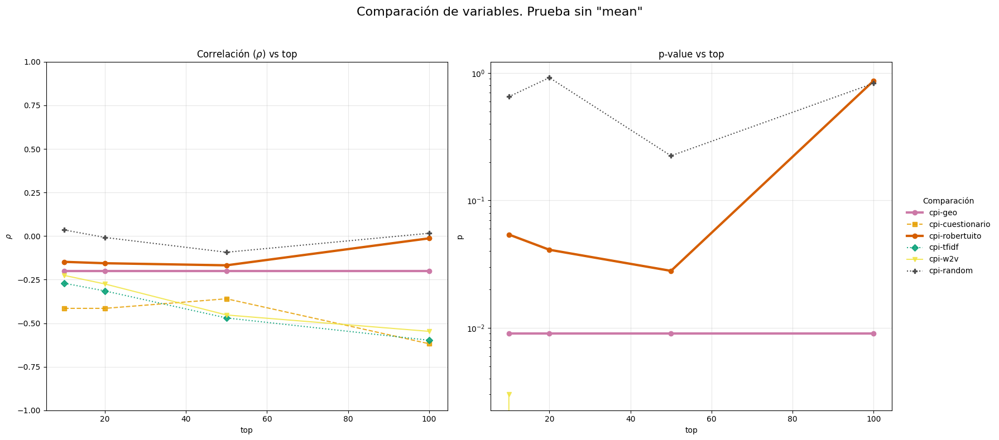

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

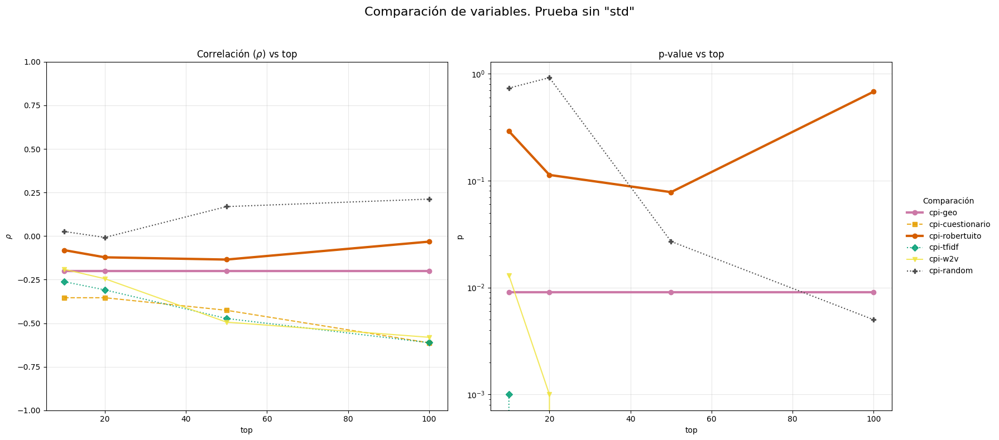

/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5462 para mantener 2 características.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 2). Ajustando a 0.5146.


/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/juancho/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5445: Con

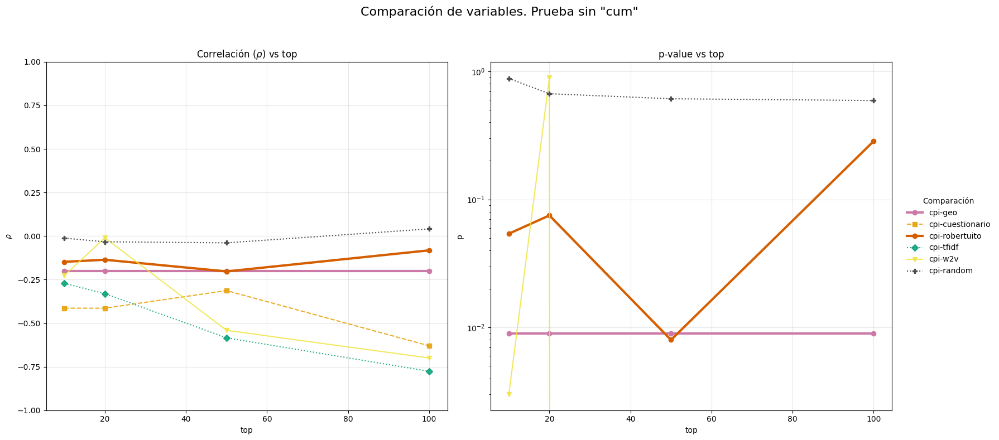

In [26]:
thres['w2v'] = 0.6

stats = ['mean', 'std', 'cum']
for stat in stats:
    aux_stats = stats.copy()
    aux_stats.remove(stat)
    wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    take_statistics=aux_stats,
    filter_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=2
)

    srl.graph_comparison(
        wide_r, 
        wide_p,
        extra=f'Prueba sin "{stat}"',
        highlight_palette=HIGHLIGHT_COLORS
    )

### Solo con buena informacion mutua

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

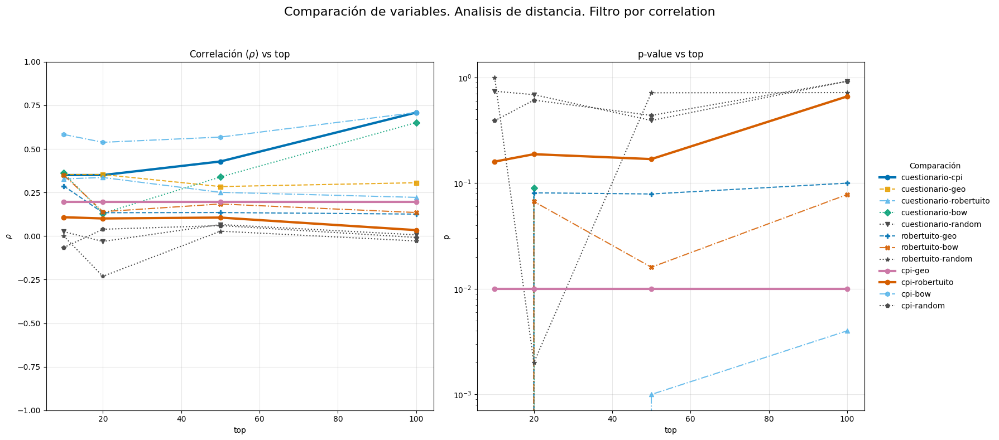

In [48]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

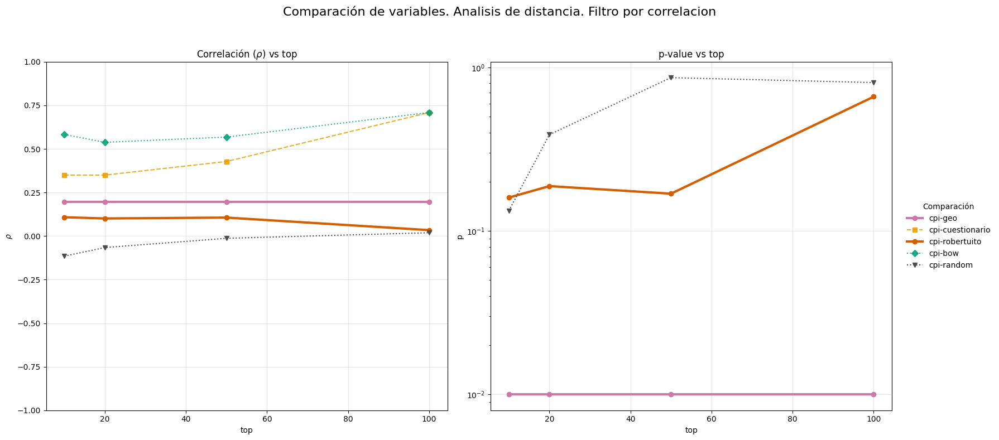

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlacion", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Sin resultados comunes

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

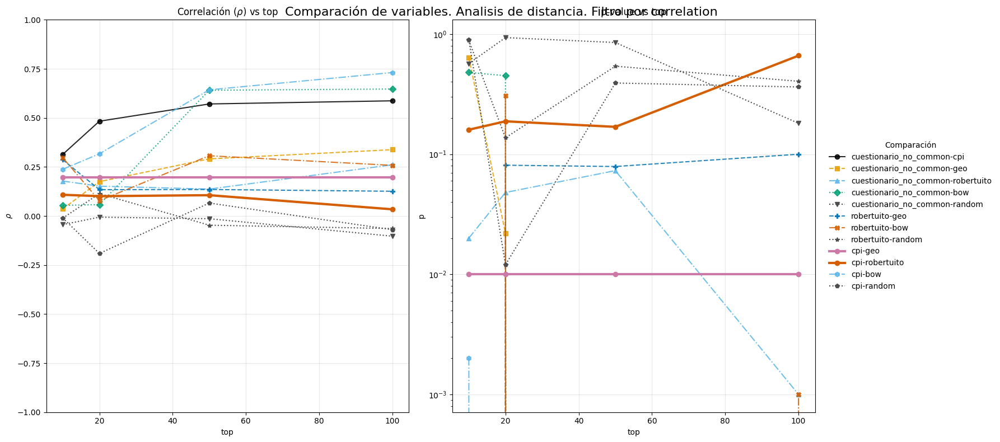

In [ ]:
thres_no_common = {
    'cuestionario_no_common': 0.5,
    'robertuito': 0,
    'tfidf': 0.6
}

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres_no_common.keys(),
    thres_dict=thres_no_common,
    ignore=ignore_no_common, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']],
    suffix='_no_common'
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Ponderado
##### Inversa de log de rango

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

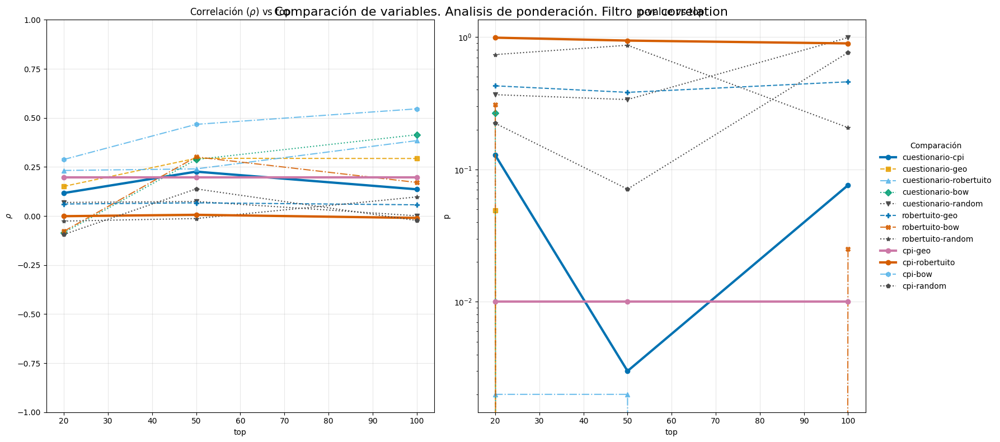

In [ ]:
thres = {
    'cuestionario': 0.3,
    'robertuito': 0,
    'tfidf': 0.6
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    thres_dict=thres,
    start=11,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "ponderación", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Mismo peso

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_bac

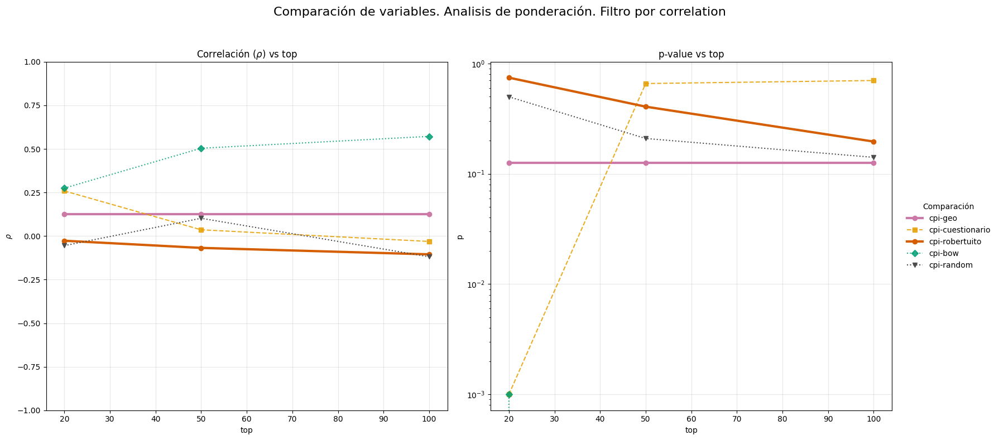

In [ ]:
segmentation = 10

thres = {
    'cuestionario': 0.3,
    'robertuito': 0,
    'tfidf': 0.6
}

def uniform(x):
    return 1.0

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=uniform,
    keys=thres.keys(),
    thres_dict=thres,
    start=11,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "ponderación", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top caracteristicas por segmento

##### Top 5

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3447 para mantener 5 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3091 para mantener 5 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4041 para mantener 12 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2532 para mantener 12 características.
Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 25). Ajustando a 0.5063.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 16 características (mínimo deseado: 25). Ajustando a 0.5223.


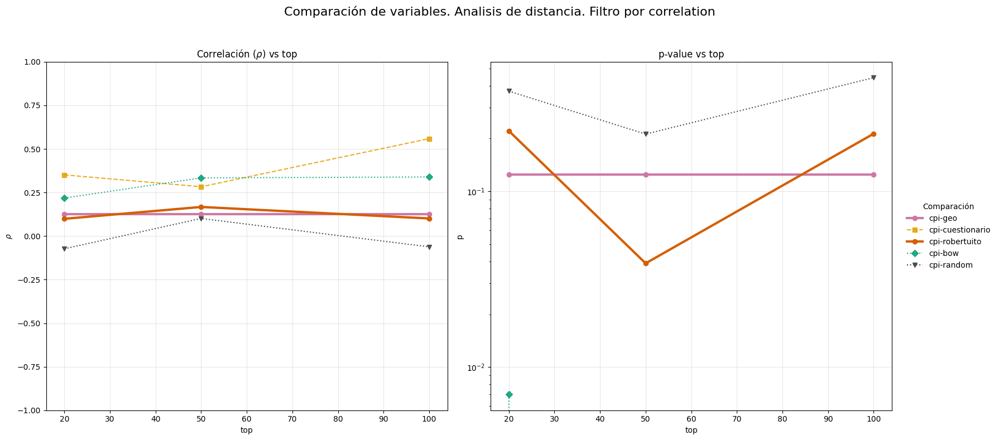

In [ ]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


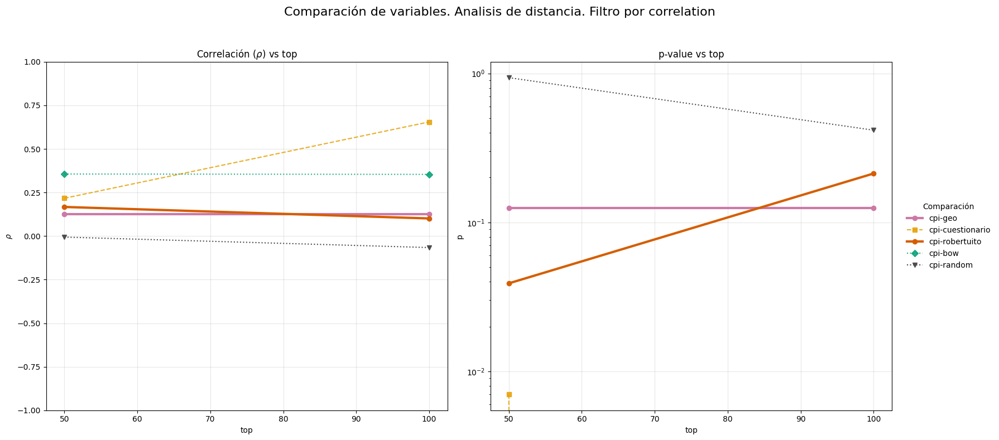

In [ ]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Top 10

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 10 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2385 para mantener 10 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4041 para mantener 25 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2385 para mantener 25 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 16 características (mínimo deseado: 50). Ajustando a 0.4841.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 31 características (mínimo deseado: 50). Ajustando a 0.5263.


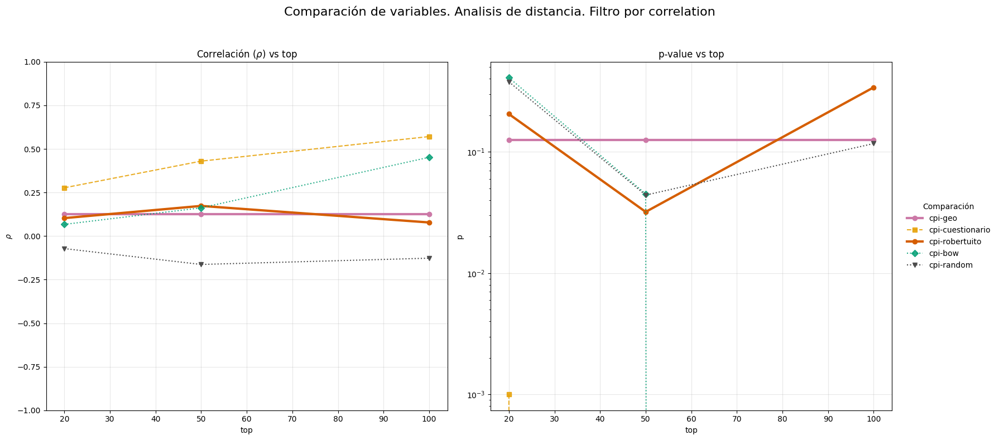

In [ ]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


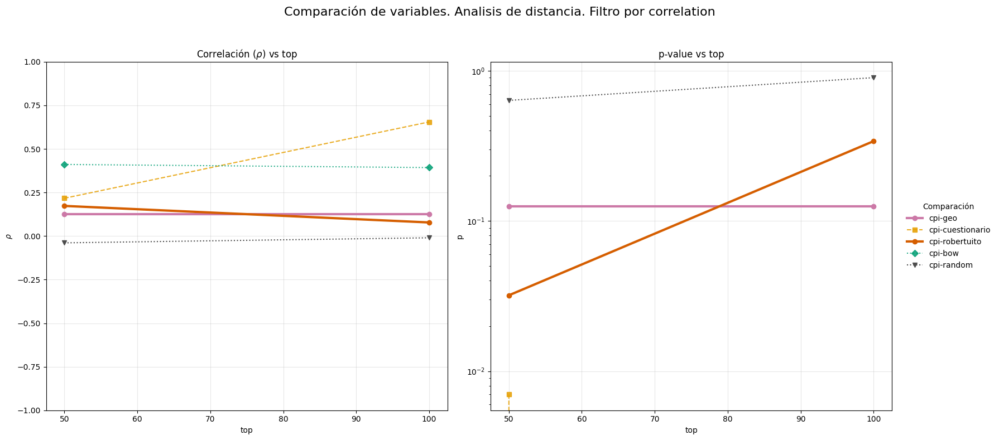

In [ ]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Top 20

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3506 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 4 características (mínimo deseado: 20). Ajustando a 0.2571.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 50). Ajustando a 0.4035.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 7 características (mínimo deseado: 50). Ajustando a 0.3358.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 20 características (mínimo deseado: 100). Ajustando a 0.4487.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 97 características (mínimo deseado: 100). Ajustando a 0.5899.


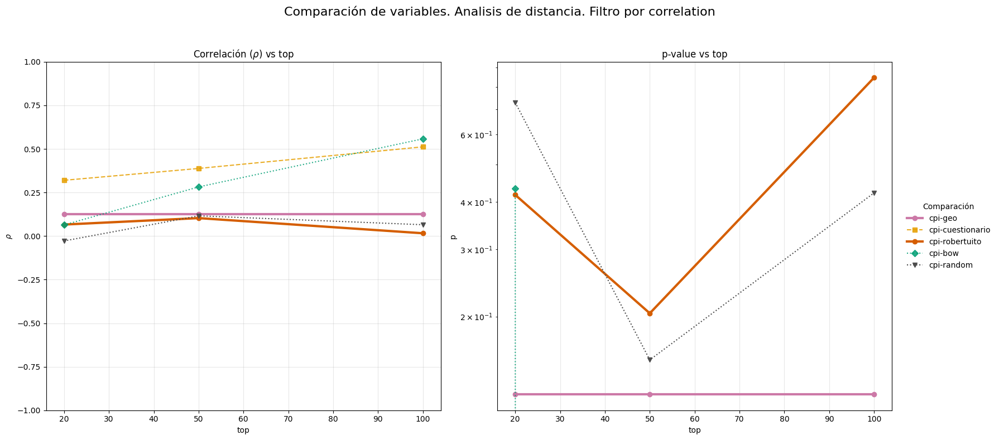

In [ ]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


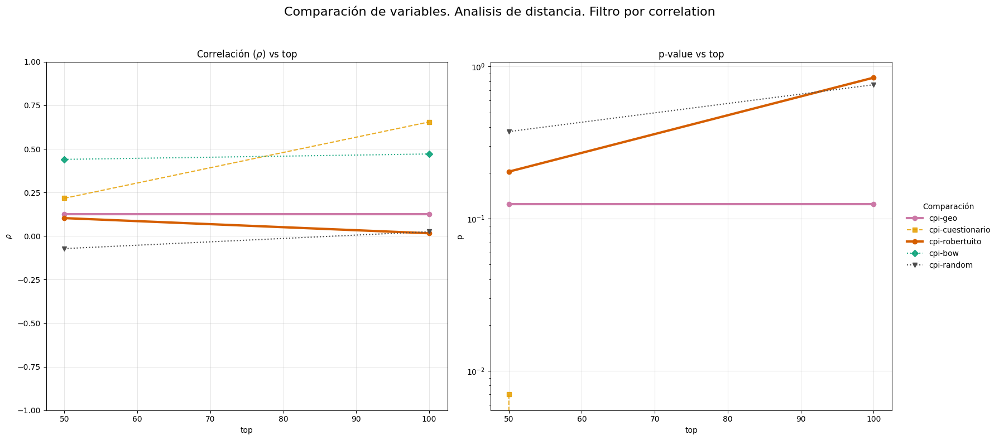

In [ ]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Preguntas mas relevantes

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

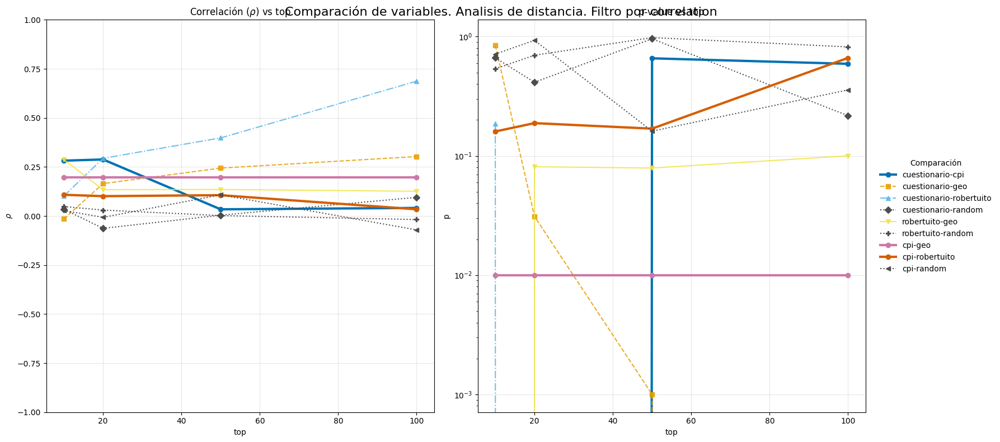

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='question', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top k incisos de preguntas mas relevantes
##### k = 1

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

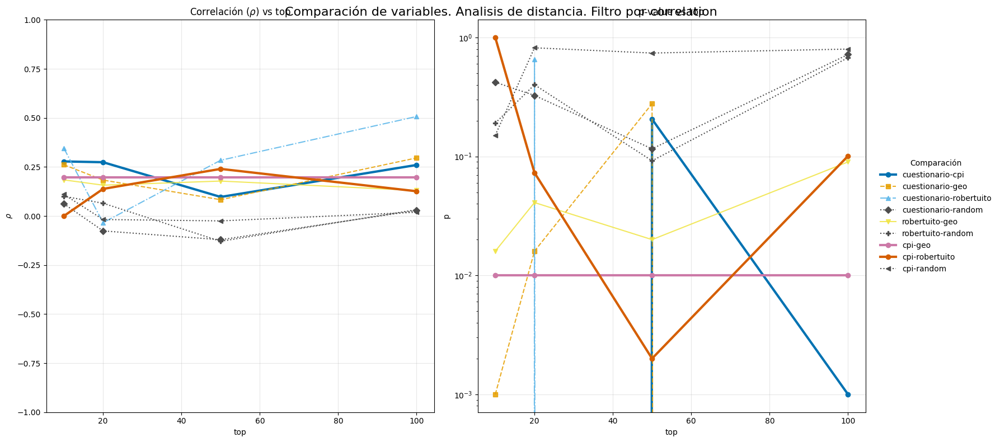

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=1,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 2

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

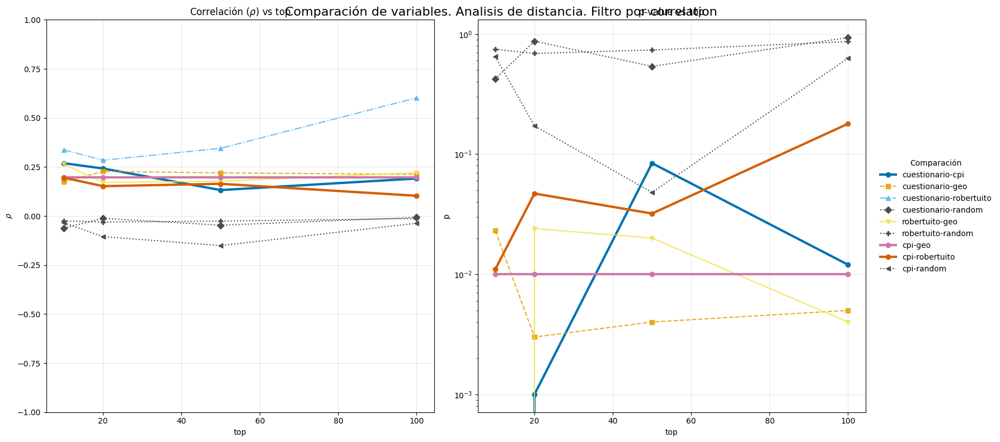

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=2,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 3

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

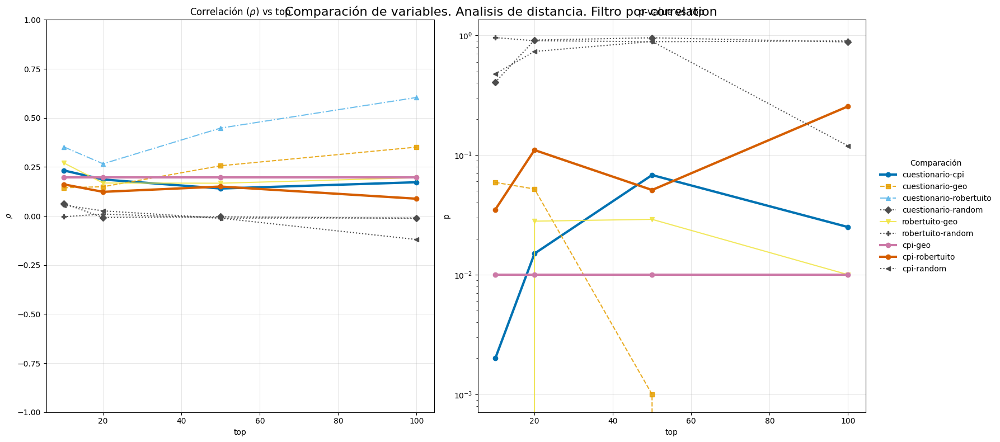

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top k por estadistico
##### k = 1

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

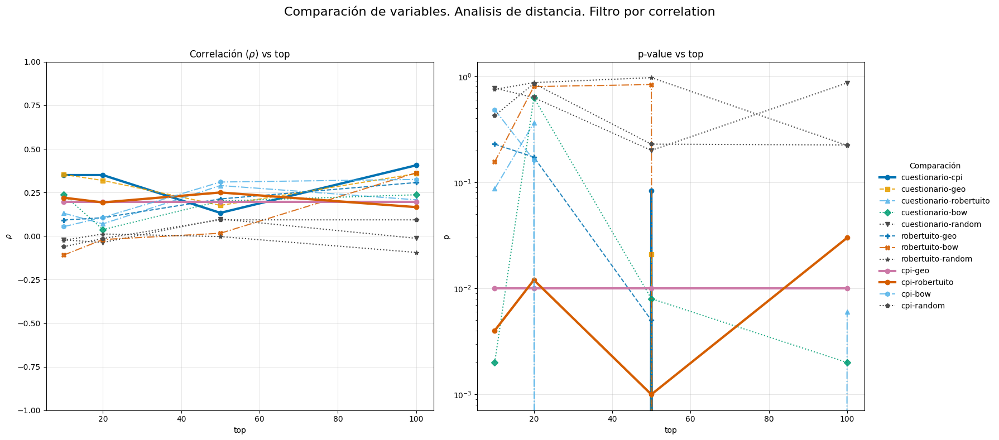

In [ ]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=1,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 2

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

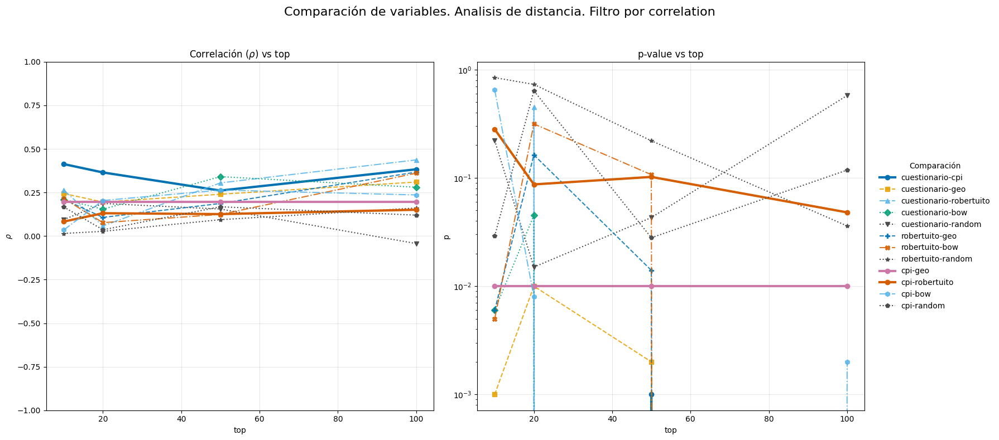

In [ ]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 3

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

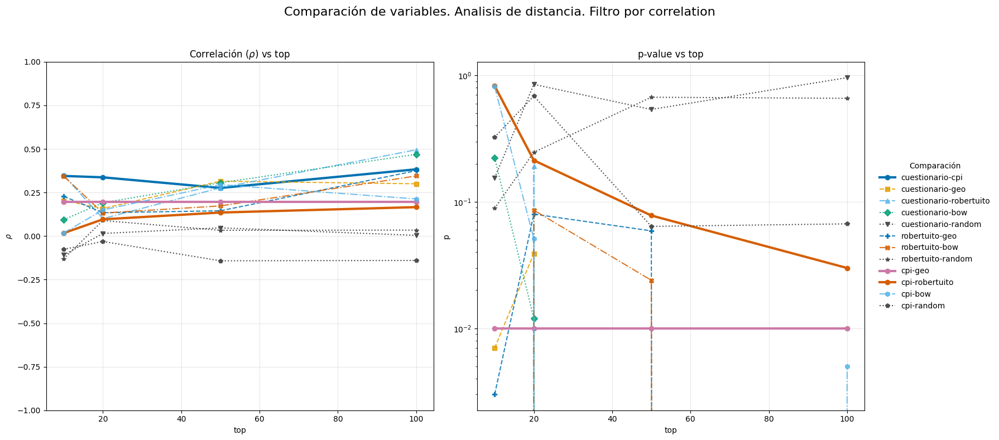

In [16]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Estadisticos por separado

Filtrando por all...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

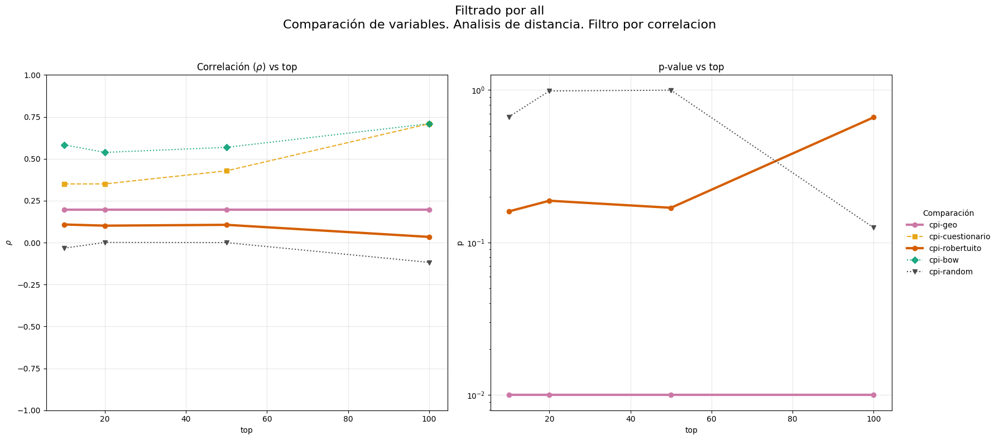

Filtrando por ['mean']...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


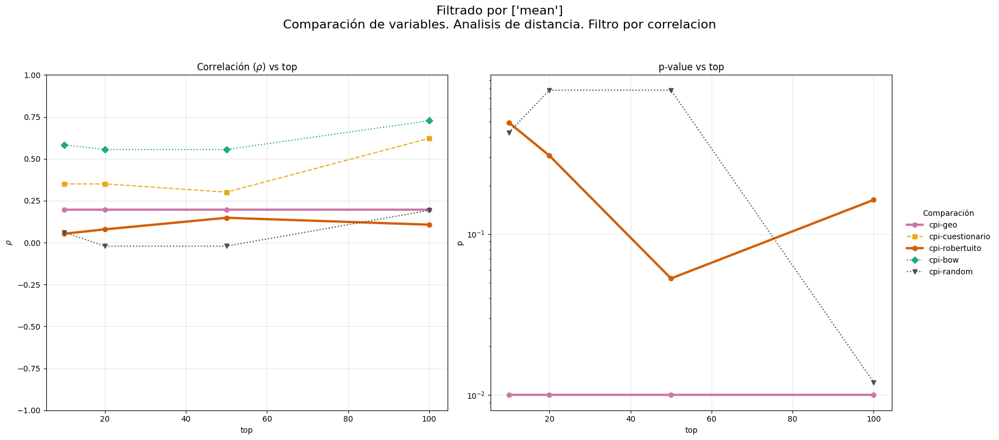

Filtrando por ['std']...
Error al filtrar por ['std']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.
Filtrando por ['cum']...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

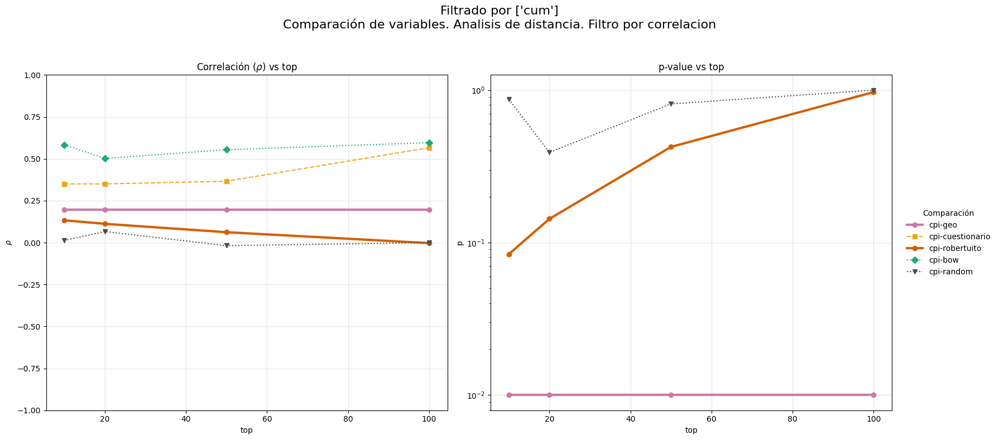

Filtrando por ['diff']...
Error al filtrar por ['diff']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.
Filtrando por ['delta_cum']...
Error al filtrar por ['delta_cum']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


In [26]:
for stat in ['all', ['mean'], ['std'], ['cum'], ['diff'], ['delta_cum']]:
    print(f"Filtrando por {stat}...")
    try:
        wide_r, wide_p = srl.compare_research_variables(
            df_dict, 
            tops, 
            corr_dict, 
            analysis_func='distance',
            keys=thres.keys(),
            thres_dict=thres,
            ignore=ignore, 
            segmentation=segmentation, 
            take_statistics=stat,
            expanded=True, 
            filter_by='correlation', 
            compare_to=df_dict["cpi"][['cpi']]
        )

        srl.graph_comparison(
            wide_r, 
            wide_p, 
            "distancia", 
            "correlacion", 
            extra_info=f"Filtrado por {stat}",
            highlight_palette=HIGHLIGHT_COLORS
        )
    except Exception as e:
        print(f"Error al filtrar por {stat}: {e}")

### Grupos semanticos

In [ ]:
'''t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
'''
_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['tfidf'],
    expanded=True,
    threshold=0.6,
    by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    min_features_ratio=20,
    )

import re
feats = wide.columns
feats_clean = set([re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", item) for item in feats])
feats_clean

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


{'gerencia',
 'grecia',
 'escasos',
 'encuentren',
 'situacion patrimonial',
 'corrupcion tipo',
 'this',
 'tal efecto',
 'traduce',
 '4 6',
 'caparros',
 'retribucion',
 'referidos',
 'ciencias sociales',
 'sudan sur',
 'deriva',
 'tomar',
 'si puede',
 '66',
 'demanda',
 'hara',
 'project',
 'partidista',
 'provienen',
 'https doi',
 'hacerse',
 'realice',
 'familia',
 'errores',
 'third',
 'edad',
 'costa',
 'expedientes',
 'senalan',
 'asa',
 'actor',
 'facultades',
 'acceso servicios',
 '1999',
 'denuncias corrupcion',
 'comparar',
 'conjunto',
 'positivas',
 'cantidades',
 'consultar',
 'promedio',
 'pue',
 'direcciones',
 'servidora',
 'sugieren',
 'pgr',
 'capaces',
 'excepcion',
 'grand',
 'civiles',
 'objetiva',
 'vender',
 'nombre',
 'beneficiar',
 'adquiridos',
 'facilmente',
 'politicas corrupcion',
 'relativos',
 'skip',
 'transferencias',
 '21',
 'publicas',
 'partidos',
 'violar',
 'transcript',
 'design',
 'partnership',
 'cuya',
 'tirant',
 'lituania',
 'maduro',
 'ex

In [80]:
forms_groups_dict

{'emocional_valorativo': ['emociones__b', 'emociones__e'],
 'institucional': ['involucrados__b'],
 'delitos_practicas_corruptas': [],
 'participacion_transparencia': ['intencion__c',
  'consecuencias__a',
  'consecuencias__b'],
 'actores_entidades': ['involucrados__c',
  'involucrados__g',
  'tipo_entidad__c'],
 'ruido': []}

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'emocional_valorativo'),
  Text(1, 0, 'institucional'),
  Text(2, 0, 'delitos_practicas_corruptas'),
  Text(3, 0, 'participacion_transparencia'),
  Text(4, 0, 'actores_entidades'),
  Text(5, 0, 'ruido')])

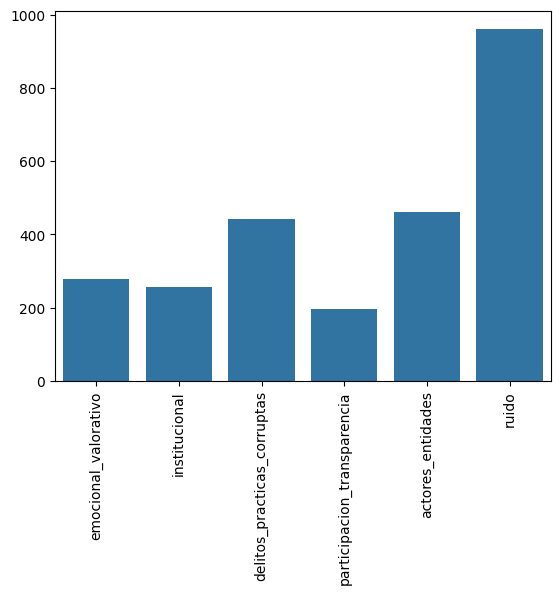

In [15]:
import json
with open('../datos/clasificacion_terminos1.json', 'r') as f:
    tfidf_groups_dict = json.load(f)
#tfidf_groups_dict['institucional'] = tfidf_groups_dict['institucional'] + tfidf_groups_dict['politico_electoral']
#tfidf_groups_dict.pop('politico_electoral')

'''with open('../datos/ruido.txt', 'w') as f:
    for term in tfidf_groups_dict['ruido']:
        f.write(term + '\n')
'''

counts = []
for key in tfidf_groups_dict.keys():
    counts.append(len(tfidf_groups_dict[key]))
sns.barplot(x=list(tfidf_groups_dict.keys()), y=counts)
plt.xticks(rotation=90)

#### Reclasificacion

##### LLM

In [47]:
tfidf_groups_dict.keys()

dict_keys(['emocional_valorativo', 'institucional', 'delitos_practicas_corruptas', 'participacion_transparencia', 'actores_entidades', 'ruido'])

<Axes: xlabel='categoria'>

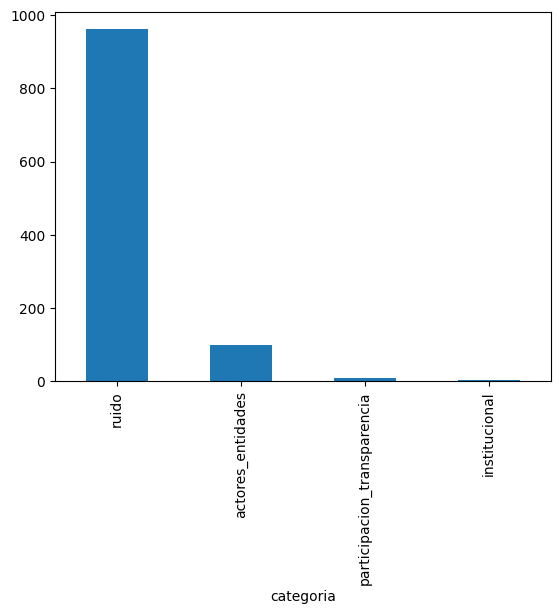

In [48]:
df = pd.read_csv('../datos/ruido_clasificado.csv', header=0, sep=',')
count = df['categoria'].value_counts()
count.plot.bar()

In [49]:
for key in tfidf_groups_dict.keys():
    if key != 'ruido':
        for i in range(df.shape[0]):
            if df.iloc[i]['categoria'] == key:
                tfidf_groups_dict[key].append(df.iloc[i]['palabra'])
tfidf_groups_dict['ruido'] = df[df['categoria'] == 'ruido']['palabra'].tolist()

In [50]:
with open('../datos/clasificacion_terminos1.json', 'w', encoding='utf-8') as archivo:
    json.dump(tfidf_groups_dict, archivo, ensure_ascii=False, indent=4)

##### W2V

In [71]:
def get_w2v(token, model, default='none', acentos_map=None):
    # 1. Si hay mapa, traducir el token completo (para unigramas)
    if acentos_map is not None:
        token = acentos_map.get(token, token)  # Si no está, se queda igual
    
    # 2. Lógica original (primer if)
    if ' ' not in token:
        if token in model:
            return model[token]
    
    # 3. Lógica original (segundo if, redundante pero no lo toco)
    if token in model:
        return model[token]
    
    # 4. Si es bigrama (separado por espacio)
    parts = token.split(' ')
    
    # 5. Aplicar mapa a cada parte si existe
    if acentos_map is not None:
        parts = [acentos_map.get(p, p) for p in parts]
    
    vecs = []
    # 6. Si alguna parte no está en el modelo, devolver cero o None
    if (parts[0] not in model) or (parts[1] not in model):
        if default == 'zero':
            return np.zeros(model.vector_size)
        else:
            return None
    
    # 7. Promediar vectores de las partes
    for p in parts:
        if p in model:
            vecs.append(model[p])
    if len(vecs) > 0:
        return np.mean(vecs, axis=0)
    
from gensim.models import KeyedVectors

modelo = KeyedVectors.load_word2vec_format('../datos/word2vec/complete.vector')

import unicodedata

def quitar_acentos(texto):
    return unicodedata.normalize('NFKD', texto).encode('ASCII', 'ignore').decode('ASCII')

# Construir mapa: clave sin acentos → valor con acentos (elige el más frecuente si hay colisión)
acentos_map = {}
for token_original in modelo.key_to_index:
    token_plano = quitar_acentos(token_original)
    if token_plano not in acentos_map:
        acentos_map[token_plano] = token_original
    else:
        # Si ya existe, quedarse con el de mayor frecuencia
        freq_actual = modelo.get_vecattr(acentos_map[token_plano], 'count')
        freq_nuevo = modelo.get_vecattr(token_original, 'count')
        if freq_nuevo > freq_actual:
            acentos_map[token_plano] = token_original

In [88]:
class_w2v = []
terms = []
for i, key in enumerate(tfidf_groups_dict.keys()):
    for term in tfidf_groups_dict[key]:
        terms.append(term)
        vec = get_w2v(term, modelo, default='zero', acentos_map=acentos_map)
        if vec is not None:
            class_w2v.append(vec)
        else:
            class_w2v.append(np.zeros(modelo.vector_size))
class_w2v = np.array(class_w2v)
class_w2v.shape

(2002, 400)

In [86]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
class_w2v_tsne = tsne.fit_transform(class_w2v)
min_x, max_x = class_w2v_tsne[:, 0].min(), class_w2v_tsne[:, 0].max()
min_y, max_y = class_w2v_tsne[:, 1].min(), class_w2v_tsne[:, 1].max()

In [118]:
paleta = [
    "#2C3E50",  # Azul oscuro pizarra
    "#E74C3C",  # Rojo intenso
    "#F1C40F",  # Amarillo dorado
    "#2ECC71",  # Verde esmeralda
    "#3498DB",  # Azul cielo
    "#9B59B6",   # Morado
    "#E67E22",  # Naranja
]

markers = ['o', 's', 'D', '^', 'v', 'P', '*']
zipped_colors = dict(zip(tfidf_groups_dict.keys(), paleta))
zipped_markers = dict(zip(tfidf_groups_dict.keys(), markers))
zipped_markers

{'emocional_valorativo': 'o',
 'institucional': 's',
 'delitos_practicas_corruptas': 'D',
 'participacion_transparencia': '^',
 'politico_electoral': 'v',
 'actores_entidades': 'P',
 'ruido': '*'}

In [ ]:
plt.figure(figsize=(40,40), dpi=100); plt.xlim(-max_x, max_x); plt.ylim(-max_y, max_y)

for key in list(zipped_colors.keys())[:-1]:
    indices = [i for i, term in enumerate(terms) if term in tfidf_groups_dict[key]]
    plt.scatter(class_w2v_tsne[indices, 0], class_w2v_tsne[indices, 1], color=zipped_colors[key], marker=zipped_markers[key], s=100, label=key)
    for idx in indices:
        x = class_w2v_tsne[idx,0]
        y = class_w2v_tsne[idx,1]
        plt.annotate(terms[idx], (x,y), color=zipped_colors[key], fontsize=12)
plt.legend(zipped_colors.keys(), loc='upper right', fontsize=25)

In [ ]:
vecs = []
tokens = []
vec = get_w2v('corrupcion', modelo, acentos_map=acentos_map)
if vec is not None:
    vecs.append(vec)
    tokens.append('corrupcion')
for token in df_dict['tfidf'].columns:
    if (' ' not in token) and all(subs not in token for subs in ['corrupcion ', ' corrupcion']):
        vec = get_w2v(token, modelo, acentos_map=acentos_map)
        if vec is not None:
            vecs.append(vec)
            tokens.append(token)

kv = KeyedVectors(vector_size=modelo.vector_size)
kv.add_vectors(tokens, vecs)

#del modelo, vecs, tokens

sim_w2v = kv.most_similar('corrupcion', topn=400)
df_dict['w2v'] = df_dict['tfidf'][[tup[0] for tup in sim_w2v]].copy()
#del kv, sim_w2v

#### Resultados (primera clasificacion)

Analizando grupo emocional_valorativo...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.


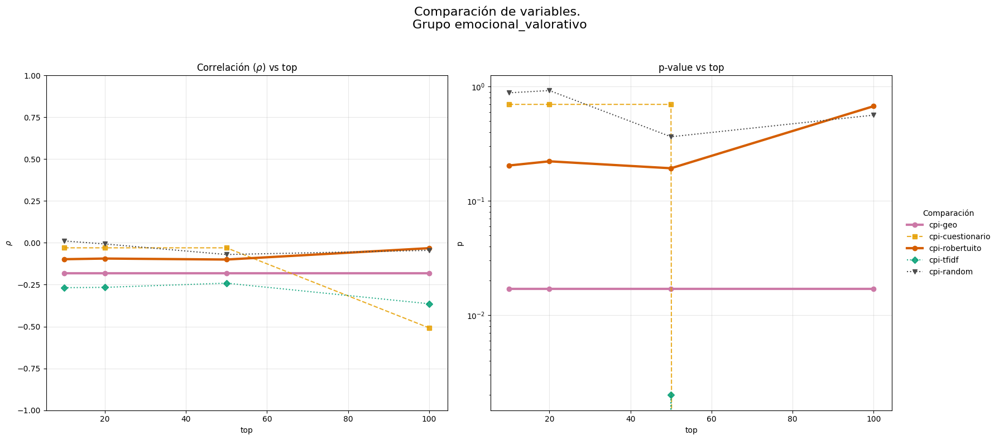

Analizando grupo institucional...
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.3499.
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.3665.
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.4225.


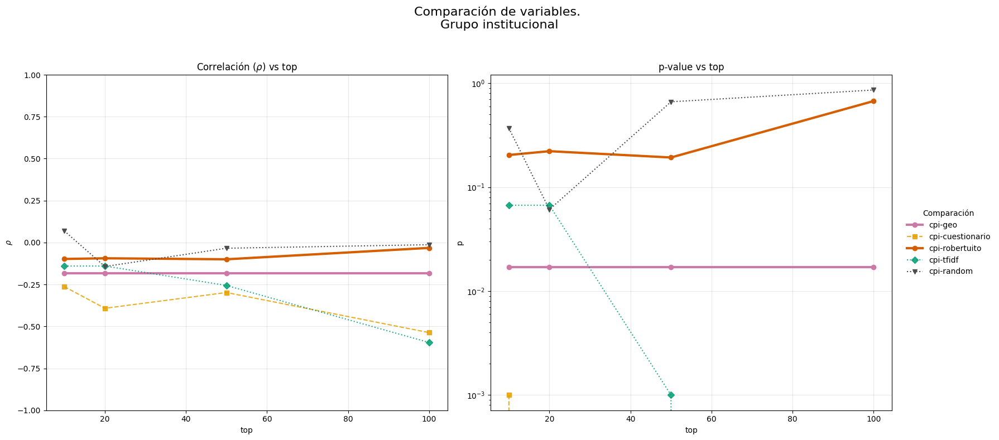

Analizando grupo delitos_practicas_corruptas...


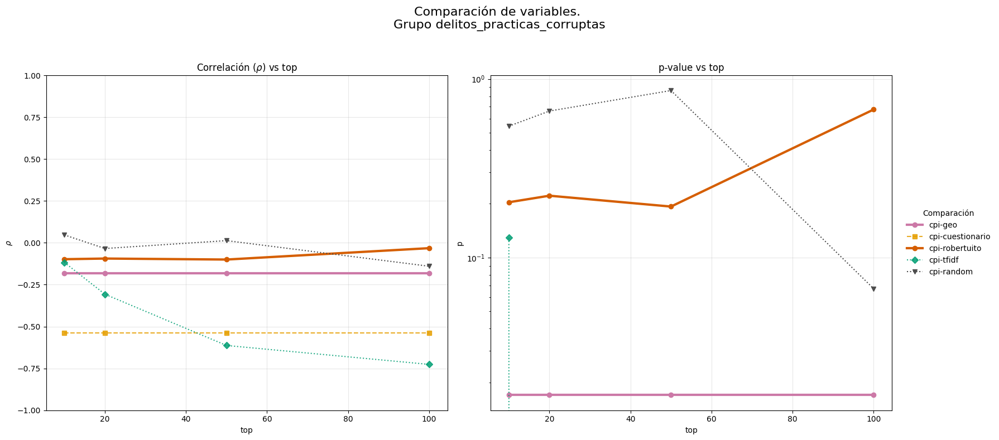

Analizando grupo participacion_transparencia...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3833 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3833 para mantener 3 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 3). Ajustando a 0.5029.


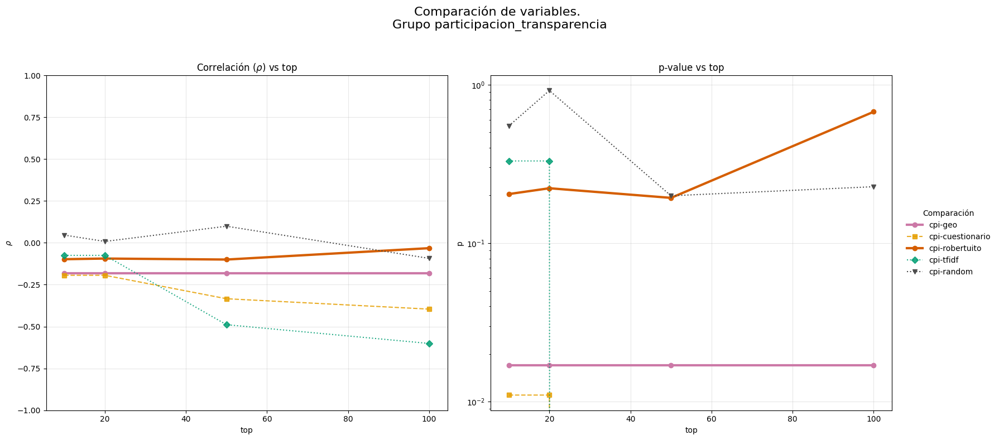

Analizando grupo actores_entidades...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3207 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3603 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4571 para mantener 3 características.


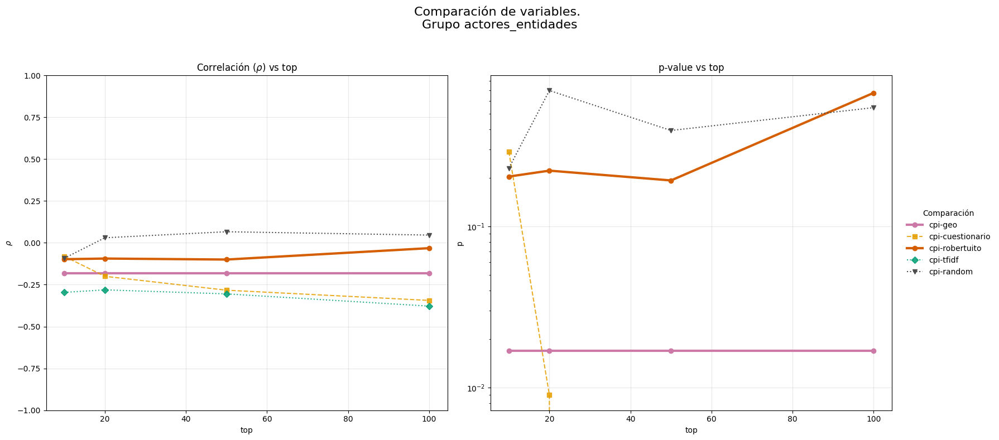

Analizando grupo ruido...


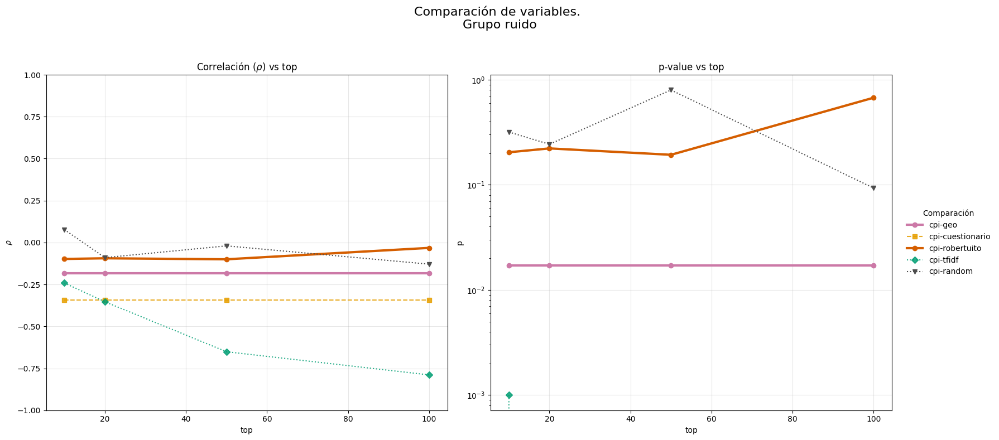

In [70]:
import warnings
warnings.filterwarnings("ignore")

t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}

forms_groups_dict = {'emocional_valorativo': ['emociones__b', 'emociones__e'],
    'institucional': ['involucrados__b'],
    'delitos_practicas_corruptas': [],
    'participacion_transparencia': ['intencion__c', 'consecuencias__a', 'consecuencias__b'],
    'actores_entidades': ['involucrados__c', 'involucrados__g', 'tipo_entidad__c'],
    'ruido': []
}
with open('../datos/clasificacion_terminos.json', 'r') as f:
    tfidf_groups_dict = json.load(f)
tfidf_groups_dict['institucional'] = tfidf_groups_dict['institucional'] + tfidf_groups_dict['politico_electoral']
tfidf_groups_dict['politico_electoral']

for group in forms_groups_dict.keys():
    print(f"Analizando grupo {group}...")
    
    df_group_dict = {}
    for key in df_dict:
        if key in ['cuestionario', 'tfidf']:
            df_group_dict[key] = df_dict[key][forms_groups_dict[group] if key == 'cuestionario' else tfidf_groups_dict[group]]
            if df_group_dict[key].shape[1] == 0:
                df_group_dict.pop(key)
        else:
            df_group_dict[key] = df_dict[key]
    thres_group = {key: thres[key] for key in df_group_dict if key in thres}

    wide_r, wide_p = srl.compare_research_variables(
        df_group_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres_group.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='correlation',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=3
    )

    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra=f"\nGrupo {group}",
        highlight_palette=HIGHLIGHT_COLORS
    )

Analizando grupo emocional_valorativo...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4418 para mantener 3 características.


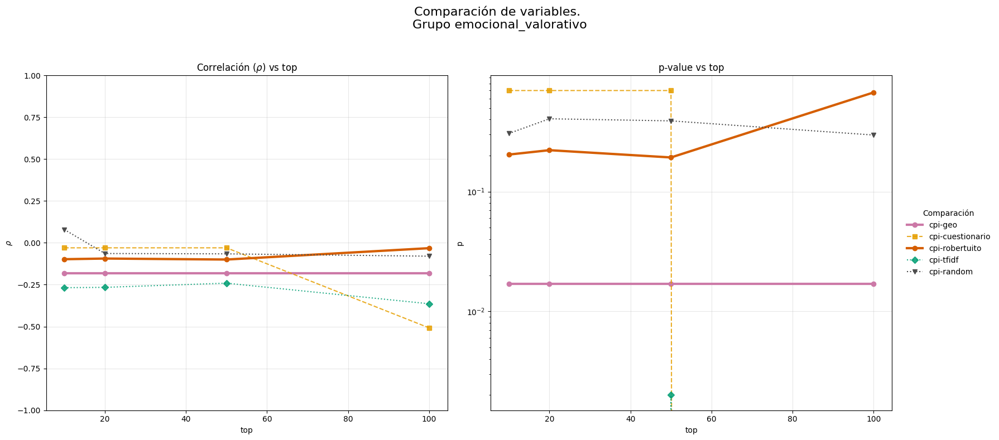

Analizando grupo institucional...
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.3499.
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.3665.
Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 3). Ajustando a 0.4225.


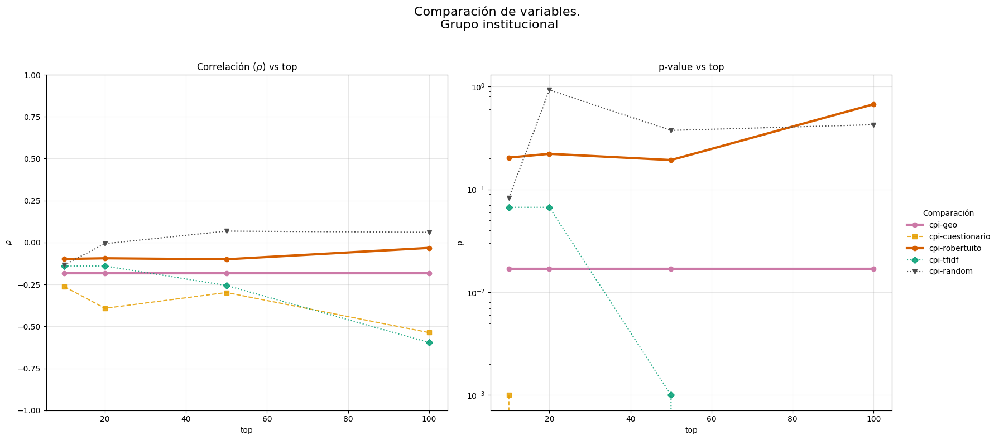

Analizando grupo delitos_practicas_corruptas...


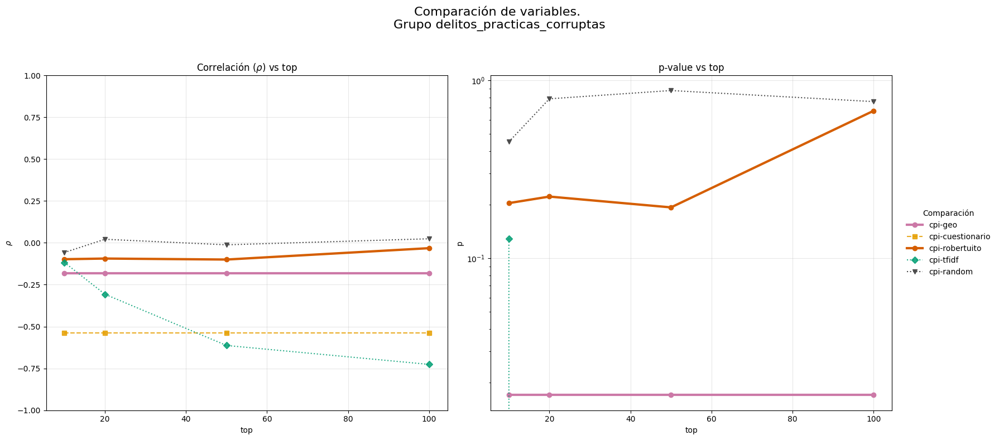

Analizando grupo participacion_transparencia...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3833 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3833 para mantener 3 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 3). Ajustando a 0.5029.


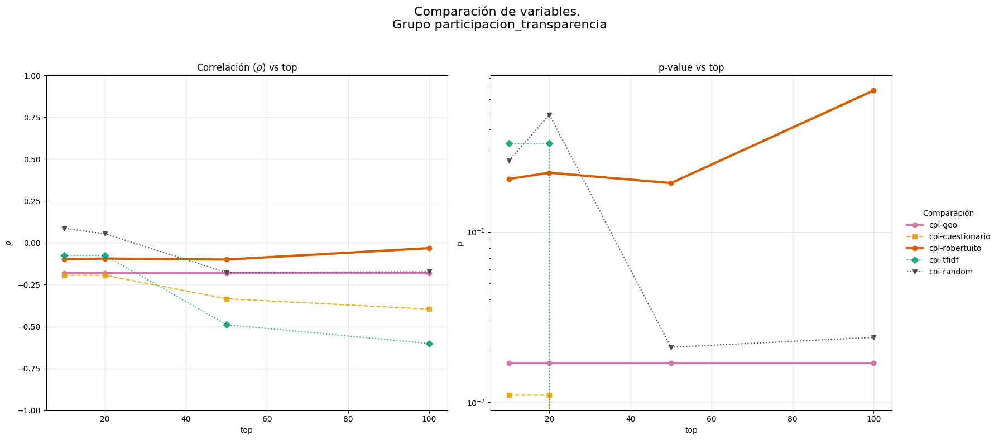

Analizando grupo actores_entidades...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3207 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3603 para mantener 3 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4571 para mantener 3 características.


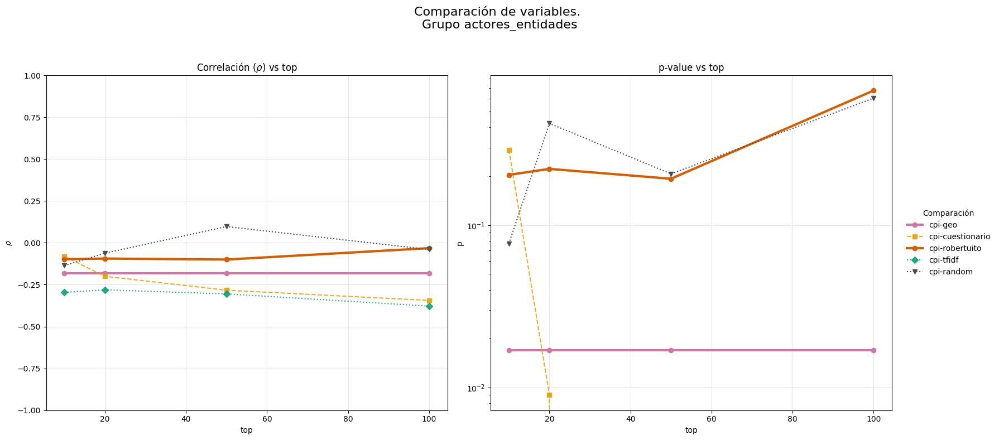

Analizando grupo ruido...


In [ ]:
import warnings
warnings.filterwarnings("ignore")

t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'tfidf': t
}

forms_groups_dict = {'emocional_valorativo': ['emociones__b', 'emociones__e'],
    'institucional': ['involucrados__b'],
    'delitos_practicas_corruptas': [],
    'participacion_transparencia': ['intencion__c', 'consecuencias__a', 'consecuencias__b'],
    'actores_entidades': ['involucrados__c', 'involucrados__g', 'tipo_entidad__c'],
    'ruido': []
}
with open('../datos/clasificacion_terminos.json', 'r') as f:
    tfidf_groups_dict = json.load(f)
tfidf_groups_dict['institucional'] = tfidf_groups_dict['institucional'] + tfidf_groups_dict['politico_electoral']
tfidf_groups_dict['politico_electoral']

for group in forms_groups_dict.keys():
    print(f"Analizando grupo {group}...")
    
    df_group_dict = {}
    for key in df_dict:
        if key in ['cuestionario', 'tfidf']:
            df_group_dict[key] = df_dict[key][forms_groups_dict[group] if key == 'cuestionario' else tfidf_groups_dict[group]]
            if df_group_dict[key].shape[1] == 0:
                df_group_dict.pop(key)
        else:
            df_group_dict[key] = df_dict[key]
    thres_group = {key: thres[key] for key in df_group_dict if key in thres}

    wide_r, wide_p = srl.compare_research_variables(
        df_group_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres_group.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='correlation',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=3
    )

    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra=f"\nGrupo {group}",
        highlight_palette=HIGHLIGHT_COLORS
    )